In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 48
IN_CHANNELS = 2
N_CLASSES = 1
EPOCH = 50

### Model Settings

#### encoder

In [5]:
ENCODER = "resnet152"
ENCODER_WEIGHT = None

#### head

In [6]:
ACT = "sigmoid"
AUX_PARAM = None

### Optimizer Settings

In [7]:
OPTIM_NAME = "adam"
init_lr = 1e-3
momentum = 0.9

# Epochs

In [8]:
from codes.losses import SSIMLoss
from codes.losses import MAELoss
from pytorch_msssim import ssim
from codes.metrics import PSNR
from torchcam.methods import GradCAM, CAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image
from kornia.filters.canny import Canny

In [9]:
def train_epoch(model, optimizer, dataloader, device):
  
    # change mode to train and move to current device
    model = model.train().to(device)
    canny_filter = Canny(low_threshold=0, high_threshold=0.2).to(device)
    
    loss_x = 0
    loss_y = 0
    for index, data in tqdm(enumerate(dataloader)):
        
        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)

        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)

        x = torch.cat((x, edge_x), dim=1)
        y = torch.cat((y, edge_y), dim=1)
        
        labels = torch.cat(( torch.ones(x.size()[0],  dtype=torch.float, device=device), torch.zeros(y.size()[0], dtype=torch.float, device=device) ), dim=0)
        imgs = torch.cat((x, y), dim=0)
        indices = np.random.shuffle(np.array(range(labels.size()[0])))

        labels = labels[indices][0]
        imgs = imgs[indices, :][0]
        
        prediction = model(imgs)
        prediction = Activation(name=ACT)(prediction)
        prediction = prediction.squeeze()
        loss = nn.BCELoss()(prediction.float(), labels)

                        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss += loss.item()

    return loss/(index+1)

In [10]:
@torch.no_grad()
def eval_epoch(model, dataloader, device):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    canny_filter = Canny(low_threshold=0, high_threshold=0.2).to(device)
    
    acc_x = []
    acc_y = []
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)
        
        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)
        
        x = torch.cat((x, edge_x), dim=1)
        y = torch.cat((y, edge_y), dim=1)
        
        x_cls = model(x)
        x_cls = Activation(name=ACT)(x_cls).squeeze() # zipped value to [0, 1]
        y_cls = model(y)
        y_cls = Activation(name=ACT)(y_cls).squeeze() # zipped value to [0, 1]
        
        # adversarial
        y_cls = torch.where(y_cls > 0.5, 1, 0)
        acc = Accuracy()(y_cls, torch.zeros(y_cls.size(), device=y_cls.device))
        acc_x += [acc.item()]
        x_cls = torch.where(x_cls > 0.5, 1, 0)
        acc = Accuracy()(x_cls, torch.ones(x_cls.size(), device=x_cls.device))
        acc_y += [acc.item()]


    return sum(acc_x)/len(acc_x), sum(acc_x)/len(acc_x)

In [44]:
def test_epoch(model, dataloader, device):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    canny_filter = Canny(low_threshold=0, high_threshold=0.2).to(device)
    cam_extractor = GradCAM(model, 'encoder.layer1')

    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)
        
        *_, edge_x = canny_filter(x)
        *_, edge_y = canny_filter(y)
        
        x_bar = torch.cat((x, edge_x), dim=1)
        y_bar = torch.cat((y, edge_y), dim=1)
        
        x_cls = model(x_bar)
        x_cls = Activation(name=ACT)(x_cls) # zipped value to [0, 1]        
        y_cls = model(y_bar)
        y_cls = Activation(name=ACT)(y_cls) # zipped value to [0, 1]
        
        for b in range(x.size()[0]):
            x_edge = edge_x[b, :].squeeze()
            x_tmp = x[b, :].squeeze()
            x_tmp = torch.stack((x_tmp, x_tmp, x_tmp), dim=0)
            x_map = cam_extractor(0, x_cls)
            overlay_x = overlay_mask(to_pil_image(x_tmp), to_pil_image(x_map[0], mode='F'), alpha=0.5)

            y_edge = edge_y[b, :].squeeze()
            y_tmp = y[b, :].squeeze()
            y_tmp = torch.stack((y_tmp, y_tmp, y_tmp), dim=0)
            y_map = cam_extractor(0, y_cls)
            overlay_y = overlay_mask(to_pil_image(y_tmp), to_pil_image(y_map[0], mode='F'), alpha=0.5)
            
            print("cbct prediction: {}, ct prediction: {}".format(x_cls, y_cls))
            visualize(
                cbct = x_tmp[0, :, :].cpu().numpy(),
                cbct_mask = overlay_x,
                cbct_edge = x_edge.cpu().numpy(),
                ct = y_tmp[0, :, :].cpu().numpy(),
                ct_mask = overlay_y,
                ct_edge = y_edge.cpu().numpy(),
            )

# Read Data

In [12]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [13]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [14]:
trainset = Dataset(path=train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [15]:
len(trainset), len(testset)

(1344, 191)

In [16]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7f426524fa30>,)

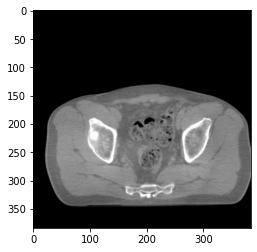

In [17]:
plt.imshow(x.squeeze(), 'gray'),

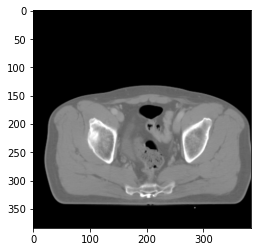

In [18]:
plt.imshow(y.squeeze(), 'gray')

In [19]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# Model

In [20]:
from codes.activation import Activation
import torchvision.models as models

In [21]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet152()
        encoder.layer2 = nn.Identity()
        encoder.layer3 = nn.Identity()
        encoder.layer4 = nn.Identity()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=256, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# training

In [22]:
import wandb

wandb.init(project="discriminator", config={
    "data": {
        "in_channels": IN_CHANNELS,
        "out_channels": N_CLASSES,
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "optimizer": OPTIM_NAME,
        "init_lr": init_lr,
        "momentum": momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": ACT,
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)


In [22]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [24]:
model = Model(in_channel=IN_CHANNELS, n_classes=N_CLASSES, activation=None)

In [25]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
optimizer = Optimizer(model.parameters(), name=OPTIM_NAME, lr=init_lr)

In [26]:
wandb.watch(model)

max_acc = 0

for epoch in range(EPOCH):
        
        loss = train_epoch(model, optimizer, trainloader, device)
        cbct_acc_train, ct_acc_train = eval_epoch(model, trainloader, device)
        cbct_acc_test, ct_acc_test = eval_epoch(model, testloader, device)

        
        wandb.log({
            "bce loss": loss,
            "trainset cbct acc": cbct_acc_train,
            "trainset ct acc": ct_acc_train,
            "testset cbct acc": cbct_acc_test,
            "testset ct acc": ct_acc_test
        })
        
        
        if max_acc <= cbct_acc_test + ct_acc_test:
            max_acc = cbct_acc_test + ct_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict()
            }
            print("epoch = {}, model save".format(epoch))
            torch.save(checkpoint, os.path.join("weight-classifier", "{}.pth".format(wandb.run.name)))

28it [01:00,  2.17s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.94s/it]

epoch = 0, model save



28it [00:55,  1.99s/it]
28it [00:50,  1.81s/it]
4it [00:07,  1.93s/it]

epoch = 1, model save



28it [00:55,  1.99s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.93s/it]

epoch = 2, model save



28it [00:56,  2.02s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.93s/it]

epoch = 3, model save



28it [00:56,  2.02s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.93s/it]

epoch = 4, model save



28it [00:57,  2.05s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.93s/it]

epoch = 5, model save



28it [00:56,  2.03s/it]
28it [00:50,  1.82s/it]
4it [00:07,  1.94s/it]

epoch = 6, model save



28it [00:56,  2.02s/it]
28it [00:50,  1.82s/it]
4it [00:07,  1.93s/it]
28it [00:55,  1.98s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.94s/it]

epoch = 8, model save



28it [00:54,  1.94s/it]
28it [00:50,  1.81s/it]
4it [00:07,  1.93s/it]

epoch = 9, model save



28it [00:54,  1.94s/it]
28it [00:48,  1.75s/it]
4it [00:07,  1.93s/it]

epoch = 10, model save



28it [00:55,  1.97s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.94s/it]

epoch = 11, model save



28it [00:56,  2.01s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.93s/it]

epoch = 12, model save



28it [00:55,  1.99s/it]
28it [00:50,  1.82s/it]
4it [00:07,  1.94s/it]

epoch = 13, model save



28it [00:56,  2.03s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.93s/it]

epoch = 14, model save



28it [00:57,  2.06s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.93s/it]

epoch = 15, model save



28it [00:55,  1.98s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.94s/it]

epoch = 16, model save



28it [00:56,  2.02s/it]
28it [00:48,  1.75s/it]
4it [00:07,  1.93s/it]
28it [00:56,  2.00s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.94s/it]

epoch = 18, model save



28it [00:56,  2.02s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.94s/it]
28it [00:57,  2.06s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.94s/it]

epoch = 20, model save



28it [00:56,  2.00s/it]
28it [00:50,  1.81s/it]
4it [00:07,  1.93s/it]

epoch = 21, model save



28it [00:56,  2.02s/it]
28it [00:51,  1.85s/it]
4it [00:07,  1.92s/it]

epoch = 22, model save



28it [00:55,  1.99s/it]
28it [00:49,  1.76s/it]
4it [00:07,  1.93s/it]

epoch = 23, model save



28it [00:56,  2.02s/it]
28it [00:48,  1.73s/it]
4it [00:07,  1.93s/it]

epoch = 24, model save



28it [00:57,  2.05s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.93s/it]

epoch = 25, model save



28it [00:55,  1.98s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.94s/it]

epoch = 26, model save



28it [00:56,  2.01s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.94s/it]

epoch = 27, model save



28it [00:56,  2.00s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.94s/it]

epoch = 28, model save



28it [00:55,  1.99s/it]
28it [00:49,  1.76s/it]
4it [00:07,  1.93s/it]

epoch = 29, model save



28it [00:56,  2.03s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.93s/it]

epoch = 30, model save



28it [00:56,  2.02s/it]
28it [00:51,  1.83s/it]
4it [00:07,  1.93s/it]
28it [00:55,  1.99s/it]
28it [00:51,  1.84s/it]
4it [00:07,  1.93s/it]

epoch = 32, model save



28it [00:56,  2.01s/it]
28it [00:49,  1.77s/it]
4it [00:07,  1.94s/it]
28it [00:58,  2.07s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.94s/it]
28it [00:56,  2.03s/it]
28it [00:51,  1.84s/it]
4it [00:07,  1.93s/it]
28it [00:56,  2.04s/it]
28it [00:51,  1.85s/it]
4it [00:07,  1.94s/it]
28it [00:54,  1.96s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.93s/it]

epoch = 37, model save



28it [00:55,  1.98s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.93s/it]
28it [00:56,  2.02s/it]
28it [00:49,  1.76s/it]
4it [00:07,  1.94s/it]
28it [00:55,  1.99s/it]
28it [00:48,  1.73s/it]
4it [00:07,  1.94s/it]
28it [00:56,  2.03s/it]
28it [00:48,  1.74s/it]
4it [00:07,  1.93s/it]

epoch = 41, model save



28it [00:55,  2.00s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.93s/it]
28it [00:56,  2.02s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.94s/it]

epoch = 43, model save



28it [00:56,  2.00s/it]
28it [00:50,  1.82s/it]
4it [00:07,  1.94s/it]

epoch = 44, model save



28it [00:54,  1.96s/it]
28it [00:50,  1.79s/it]
4it [00:07,  1.94s/it]

epoch = 45, model save



28it [00:56,  2.02s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.93s/it]

epoch = 46, model save



28it [00:55,  1.98s/it]
28it [00:51,  1.83s/it]
4it [00:07,  1.94s/it]

epoch = 47, model save



28it [00:54,  1.95s/it]
28it [00:50,  1.80s/it]
4it [00:07,  1.93s/it]

epoch = 48, model save



28it [00:56,  2.01s/it]
28it [00:49,  1.78s/it]
4it [00:07,  1.94s/it]

epoch = 49, model save


In [23]:
# run_name = wandb.run.name
run_name = "unique-sunset-49"

In [24]:
checkpoint = torch.load(os.path.join("weight-classifier", "{}.pth".format(run_name)))

In [25]:
model = Model(in_channel=IN_CHANNELS, n_classes=N_CLASSES, activation=None)
model.load_state_dict(checkpoint["model"])

<All keys matched successfully>

In [31]:
model

Model(
  (encoder): ResNet(
    (conv1): Conv2d(2, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0

In [26]:
# cbct_acc_test, ct_acc_test
eval_epoch(model, testloader, device)

4it [00:08,  2.17s/it]


(0.9999999850988388, 0.9999999850988388)

0it [00:00, ?it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


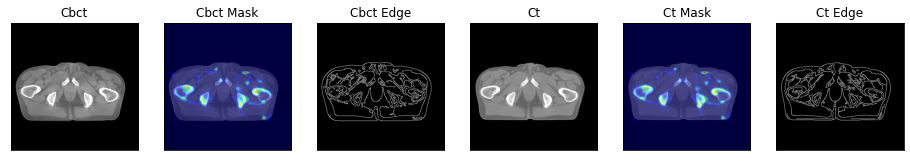

1it [00:00,  2.66it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


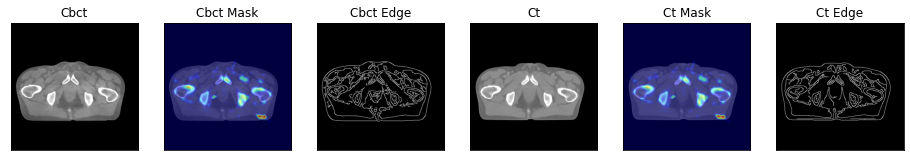

2it [00:00,  2.90it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)


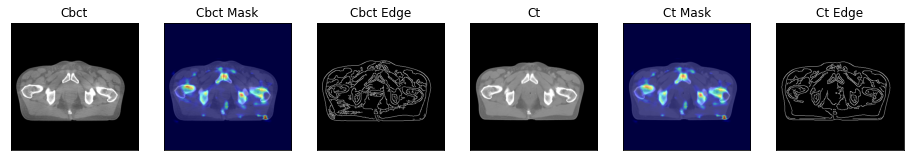

3it [00:00,  3.03it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0037]], device='cuda:0', grad_fn=<SigmoidBackward>)


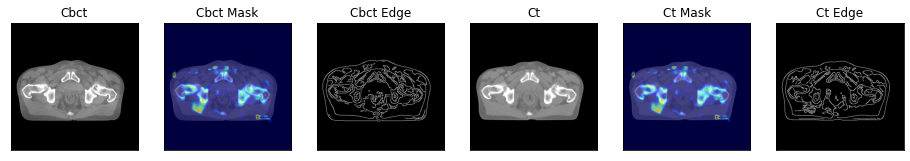

4it [00:01,  2.58it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0450]], device='cuda:0', grad_fn=<SigmoidBackward>)


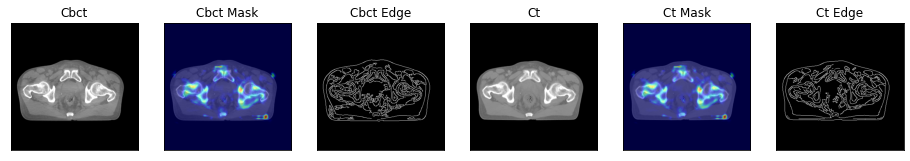

5it [00:01,  2.80it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0082]], device='cuda:0', grad_fn=<SigmoidBackward>)


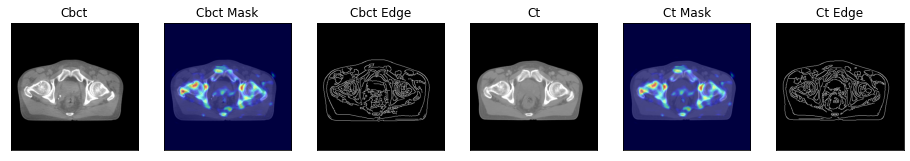

6it [00:02,  3.00it/s]

cbct prediction: tensor([[0.9999]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)


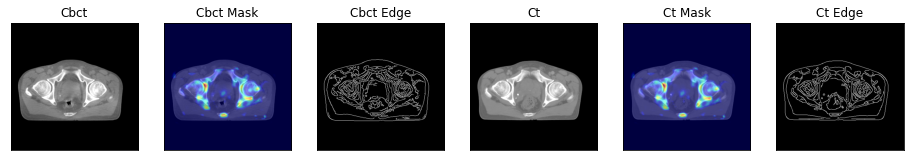

7it [00:02,  3.17it/s]

cbct prediction: tensor([[0.9999]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0015]], device='cuda:0', grad_fn=<SigmoidBackward>)


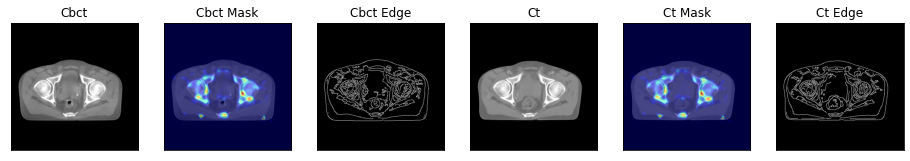

8it [00:02,  3.31it/s]

cbct prediction: tensor([[0.9996]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0023]], device='cuda:0', grad_fn=<SigmoidBackward>)


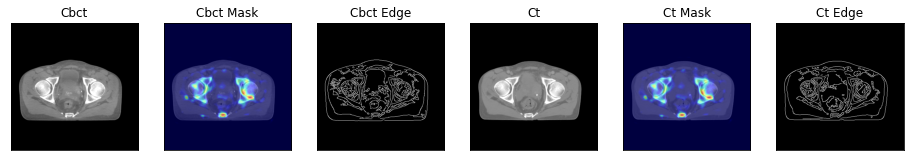

9it [00:02,  3.37it/s]

cbct prediction: tensor([[0.9998]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0041]], device='cuda:0', grad_fn=<SigmoidBackward>)


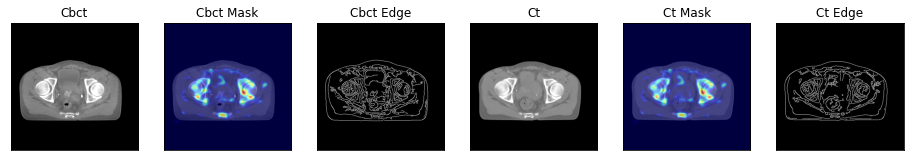

10it [00:03,  3.32it/s]

cbct prediction: tensor([[0.9999]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0025]], device='cuda:0', grad_fn=<SigmoidBackward>)


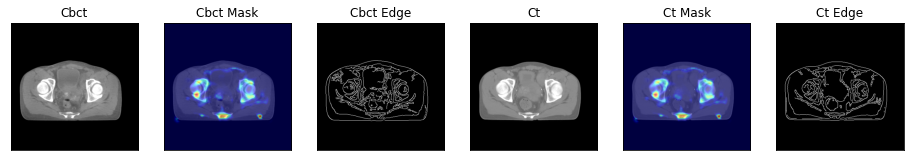

11it [00:03,  3.41it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0069]], device='cuda:0', grad_fn=<SigmoidBackward>)


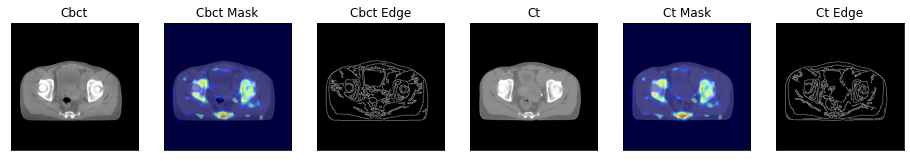

12it [00:03,  3.44it/s]

cbct prediction: tensor([[0.9974]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.8903e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


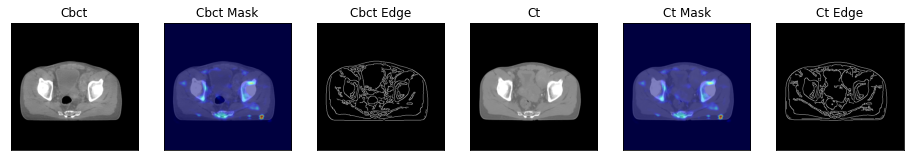

13it [00:04,  3.45it/s]

cbct prediction: tensor([[0.9998]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0154]], device='cuda:0', grad_fn=<SigmoidBackward>)


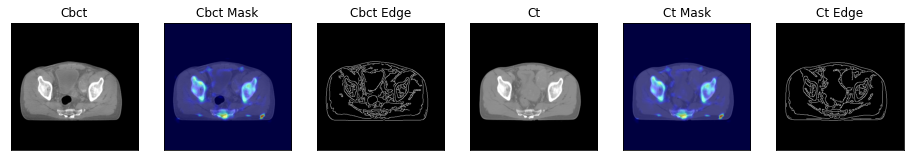

14it [00:04,  3.46it/s]

cbct prediction: tensor([[0.9999]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0130]], device='cuda:0', grad_fn=<SigmoidBackward>)


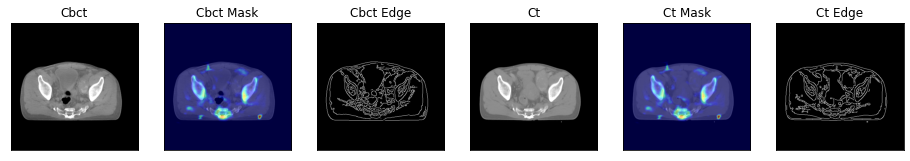

15it [00:04,  3.47it/s]

cbct prediction: tensor([[0.9980]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0033]], device='cuda:0', grad_fn=<SigmoidBackward>)


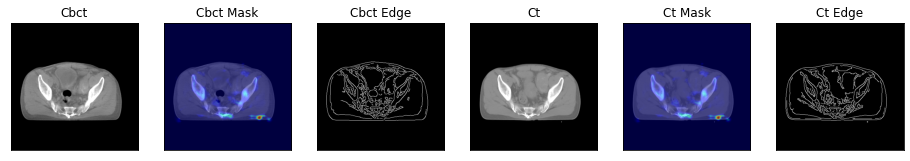

16it [00:04,  3.53it/s]

cbct prediction: tensor([[0.9988]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0027]], device='cuda:0', grad_fn=<SigmoidBackward>)


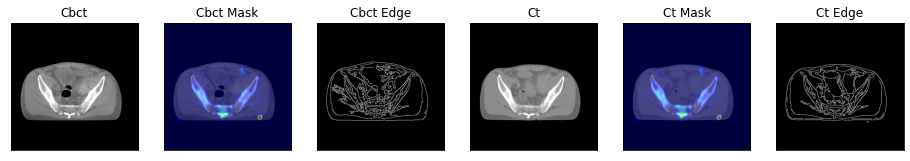

17it [00:05,  3.56it/s]

cbct prediction: tensor([[0.9979]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


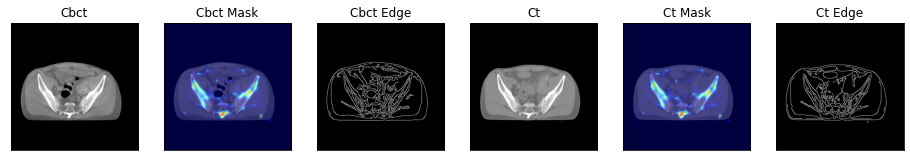

18it [00:05,  3.63it/s]

cbct prediction: tensor([[0.9991]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0015]], device='cuda:0', grad_fn=<SigmoidBackward>)


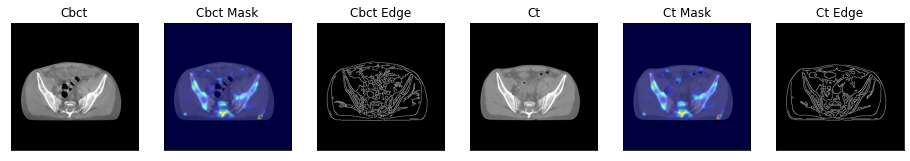

19it [00:05,  3.60it/s]

cbct prediction: tensor([[0.9945]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0009]], device='cuda:0', grad_fn=<SigmoidBackward>)


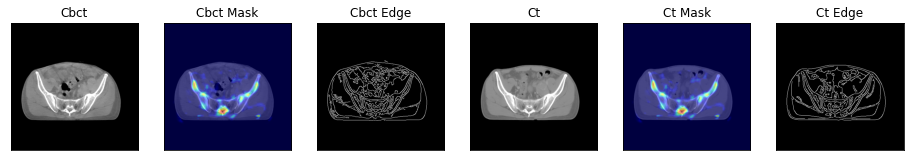

20it [00:06,  2.90it/s]

cbct prediction: tensor([[0.9952]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


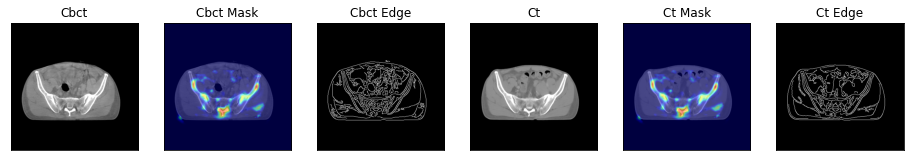

21it [00:06,  3.10it/s]

cbct prediction: tensor([[0.9967]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


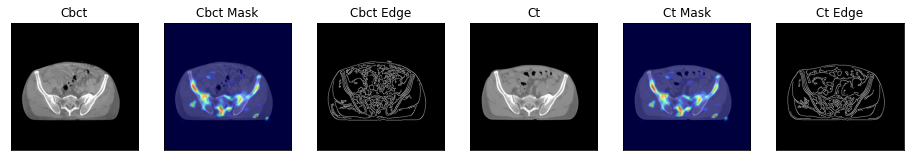

22it [00:06,  3.26it/s]

cbct prediction: tensor([[0.9954]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


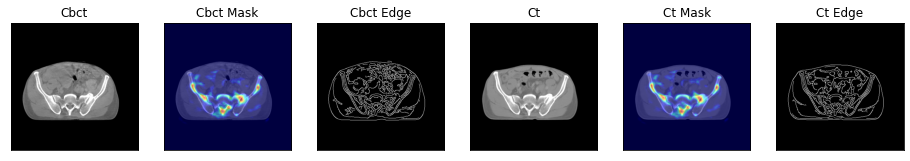

23it [00:06,  3.37it/s]

cbct prediction: tensor([[0.9983]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


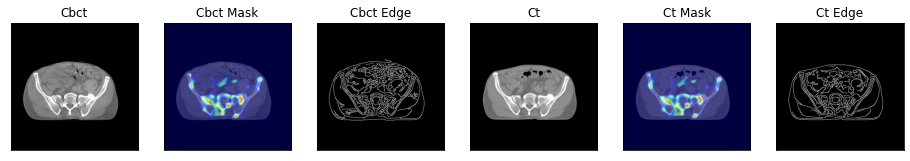

24it [00:07,  3.46it/s]

cbct prediction: tensor([[0.9989]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


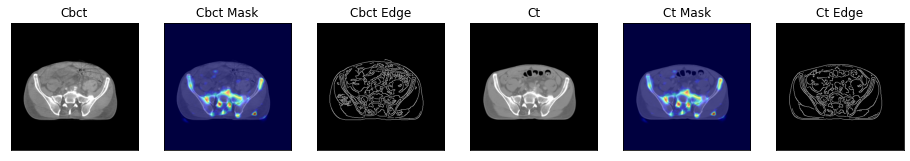

25it [00:07,  3.53it/s]

cbct prediction: tensor([[0.9980]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0010]], device='cuda:0', grad_fn=<SigmoidBackward>)


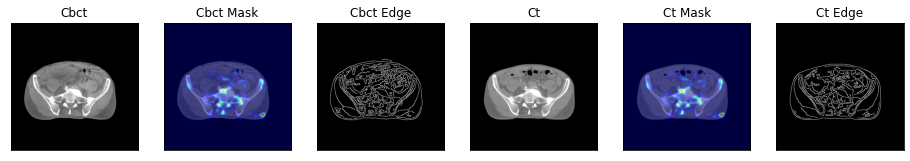

26it [00:07,  3.59it/s]

cbct prediction: tensor([[0.9997]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


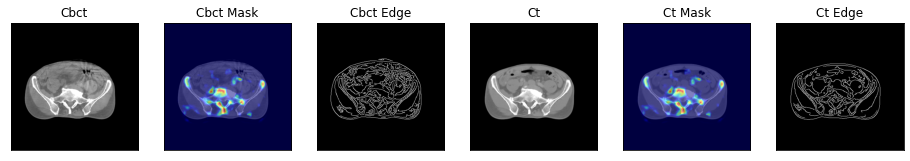

27it [00:08,  3.61it/s]

cbct prediction: tensor([[0.9986]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.5589e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


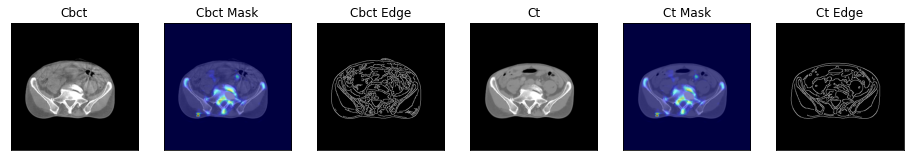

28it [00:08,  3.67it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.3803e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


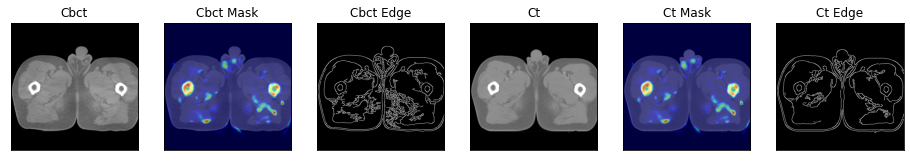

29it [00:08,  3.50it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3517e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


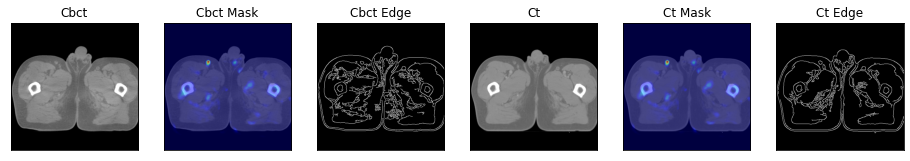

30it [00:08,  3.39it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.9021e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


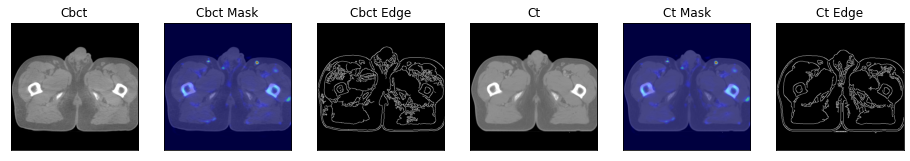

31it [00:09,  3.29it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.0299e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)


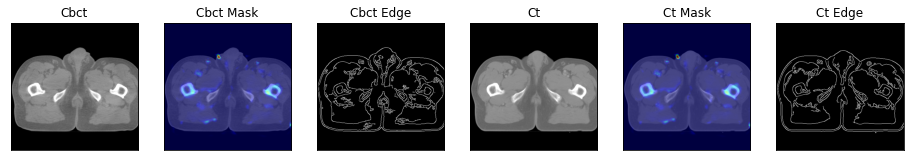

32it [00:09,  3.33it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3899e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


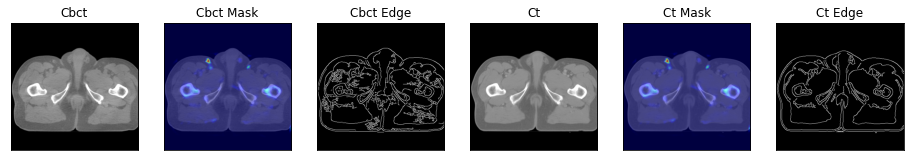

33it [00:09,  3.33it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3094e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


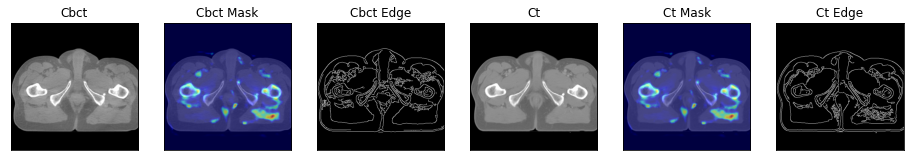

34it [00:10,  3.25it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.1784e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


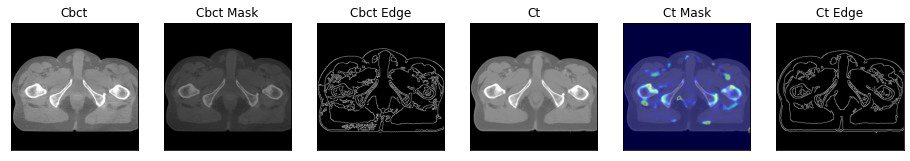

35it [00:10,  3.27it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.5305e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


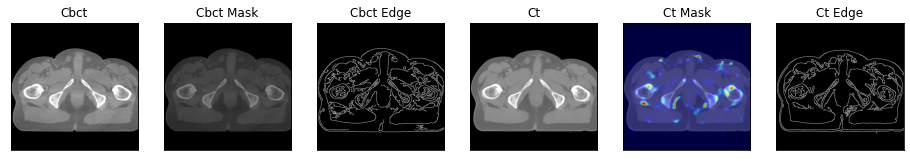

36it [00:11,  2.76it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.0313e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


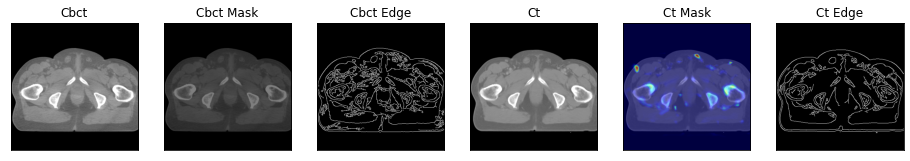

37it [00:11,  2.89it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.6016e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


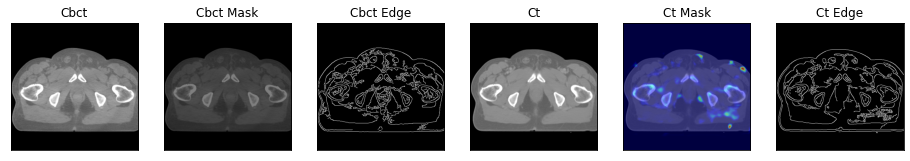

38it [00:11,  2.99it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.7096e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


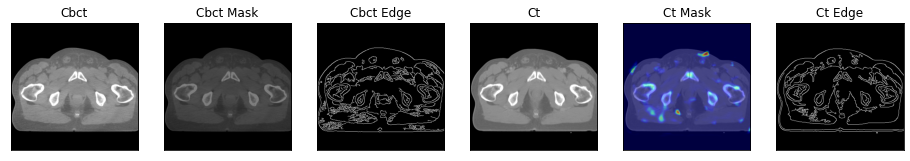

39it [00:11,  3.00it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.8025e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


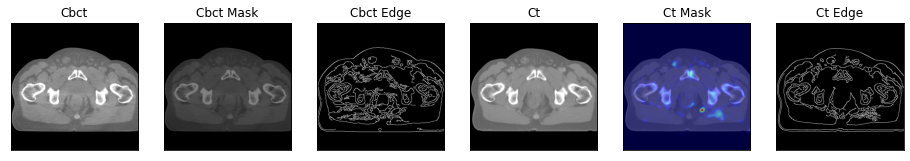

40it [00:12,  3.06it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.6040e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


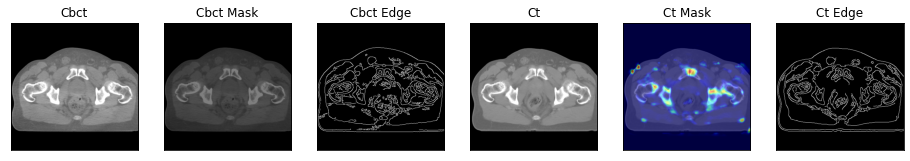

41it [00:12,  3.16it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


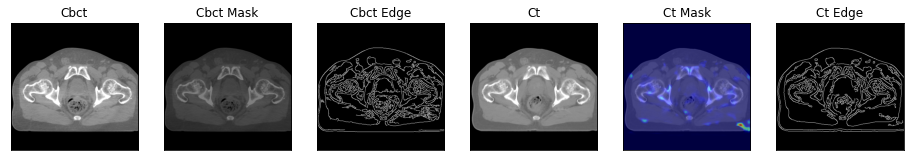

42it [00:12,  3.20it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


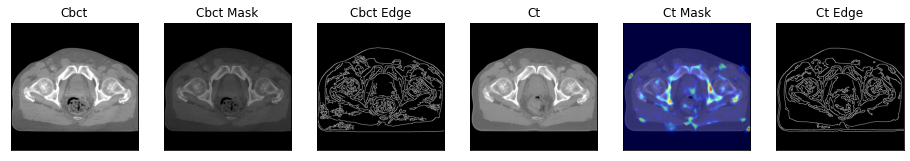

43it [00:13,  3.22it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.3938e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


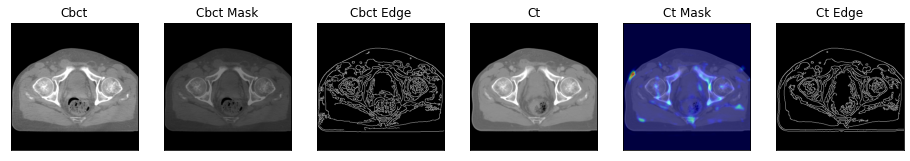

44it [00:13,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.3393e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


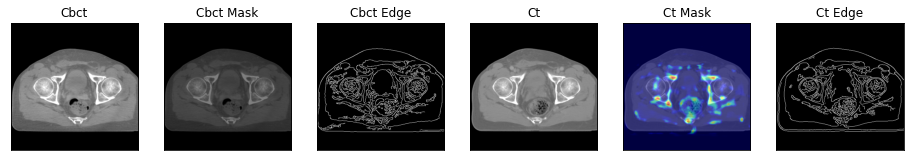

45it [00:13,  3.23it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


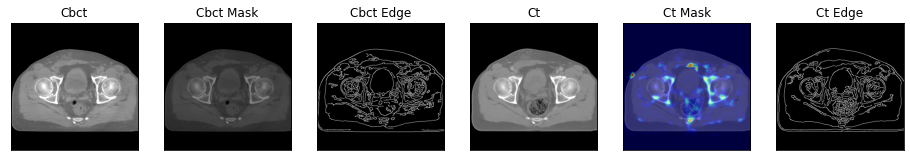

46it [00:14,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


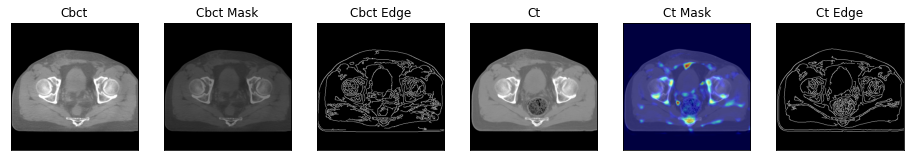

47it [00:14,  3.28it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.1551e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


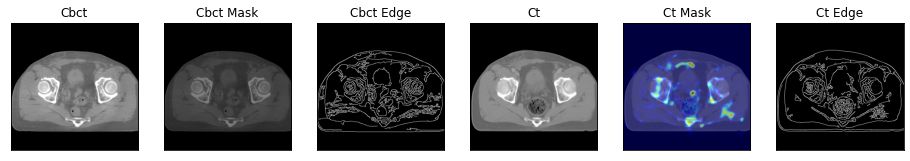

48it [00:14,  3.24it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)


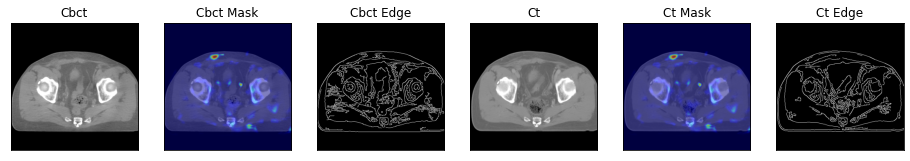

49it [00:15,  3.22it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


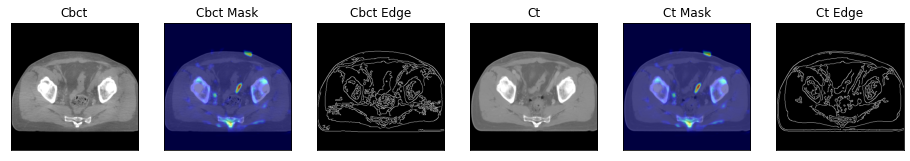

50it [00:15,  3.27it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)


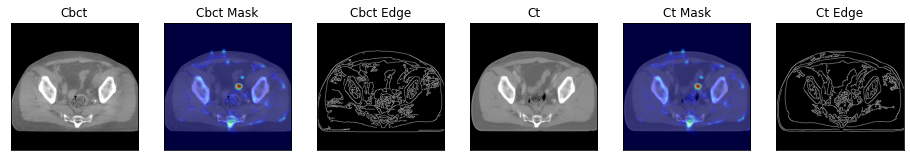

51it [00:15,  3.25it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.4762e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


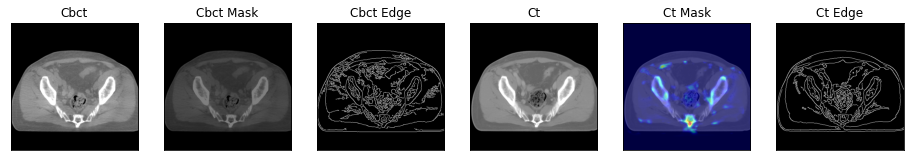

52it [00:16,  2.71it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)


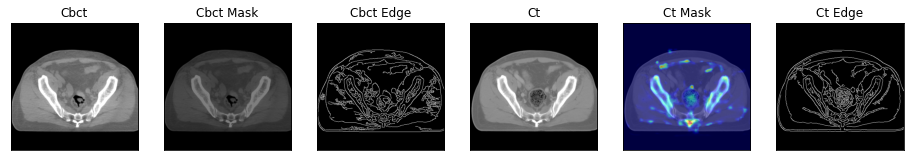

53it [00:16,  2.84it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.2986e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


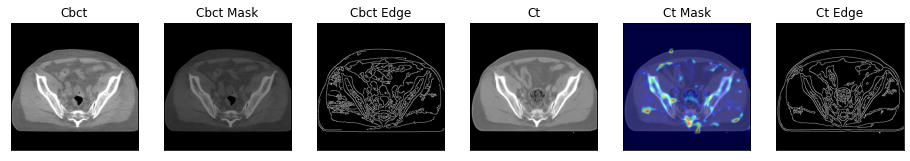

54it [00:16,  2.98it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.6529e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


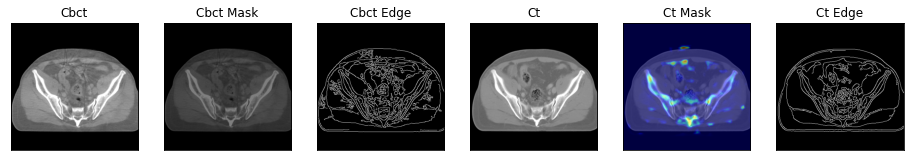

55it [00:17,  3.11it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.1167e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


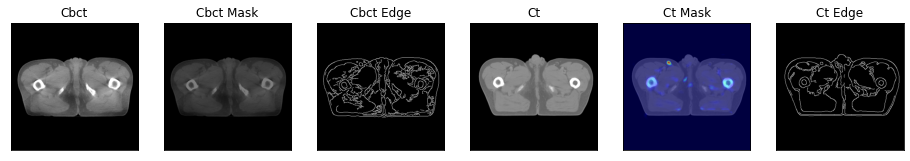

56it [00:17,  3.21it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.4909e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


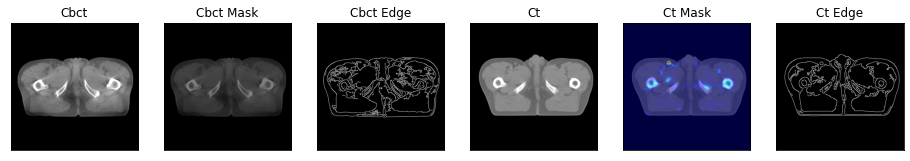

57it [00:17,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.7355e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


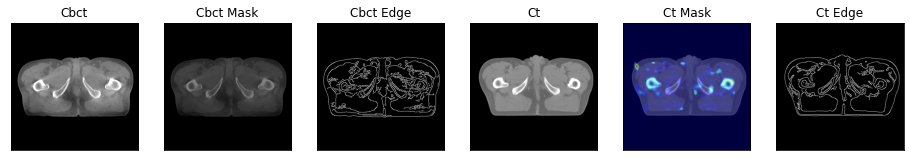

58it [00:17,  3.37it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.1893e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


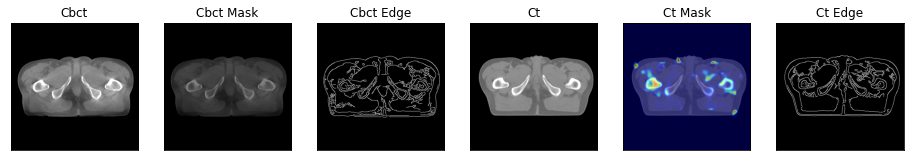

59it [00:18,  3.40it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.8152e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


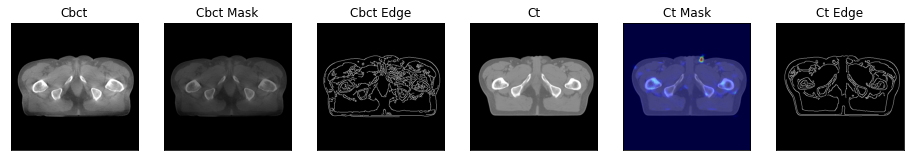

60it [00:18,  3.45it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.2245e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


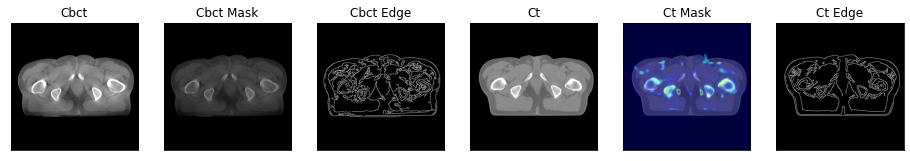

61it [00:18,  3.50it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.6262e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


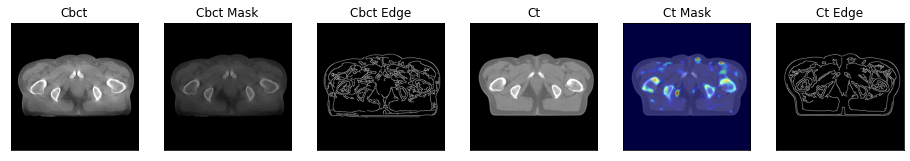

62it [00:19,  3.46it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


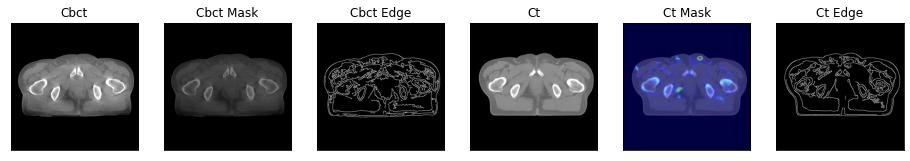

63it [00:19,  3.41it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


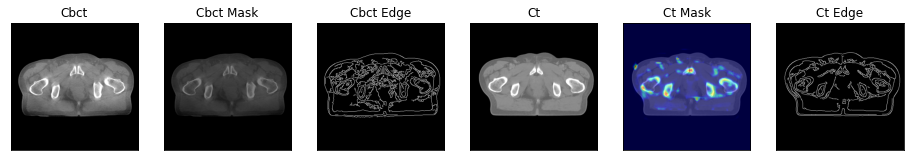

64it [00:19,  3.45it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)


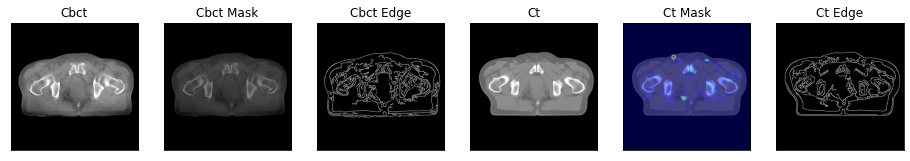

65it [00:19,  3.49it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.0501e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


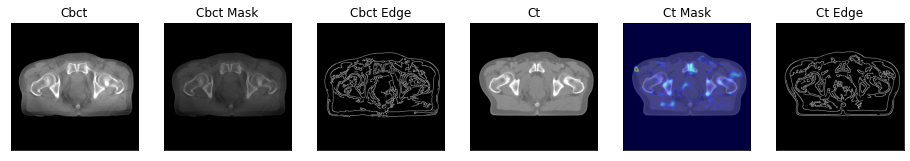

66it [00:20,  3.45it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.3158e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


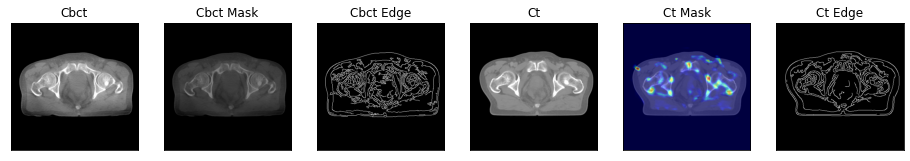

67it [00:20,  3.46it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.2068e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


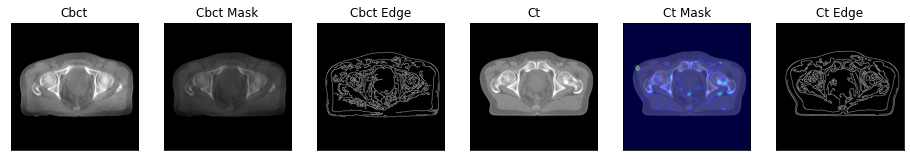

68it [00:20,  2.88it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


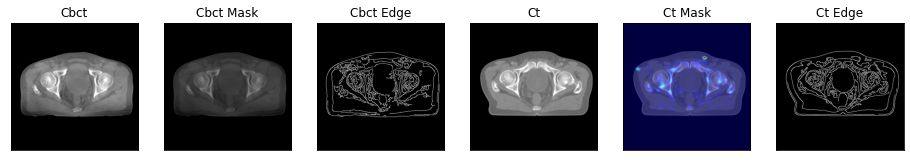

69it [00:21,  3.06it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


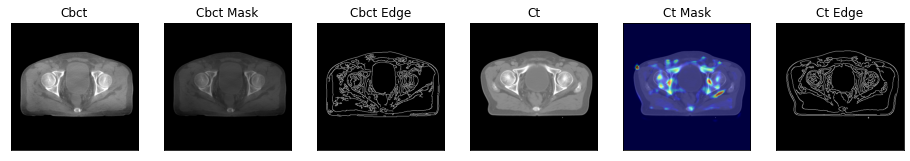

70it [00:21,  3.22it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.9142e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


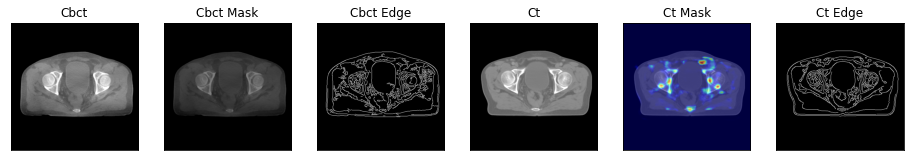

71it [00:21,  3.29it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.3796e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


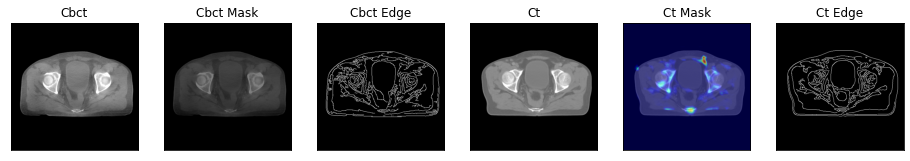

72it [00:22,  3.38it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.6893e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


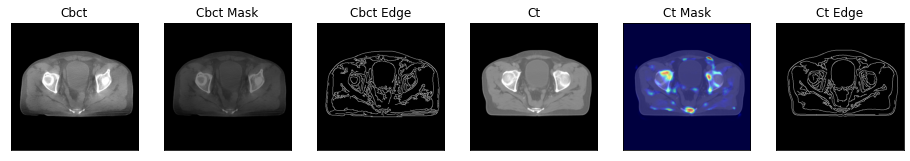

73it [00:22,  3.45it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.2116e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


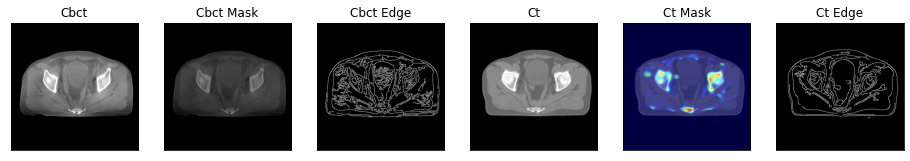

74it [00:22,  3.42it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.8531e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


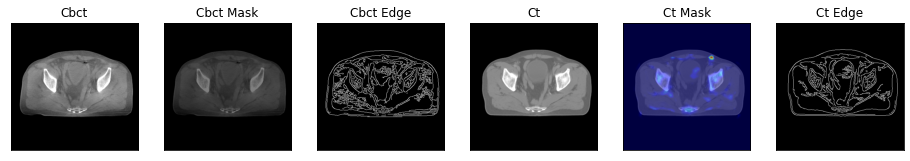

75it [00:22,  3.39it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


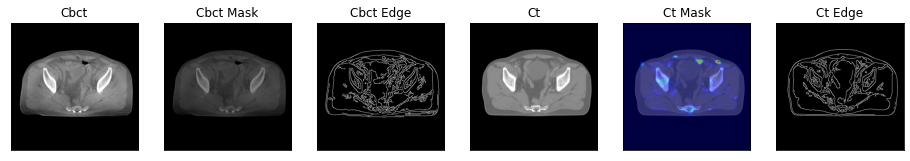

76it [00:23,  3.44it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


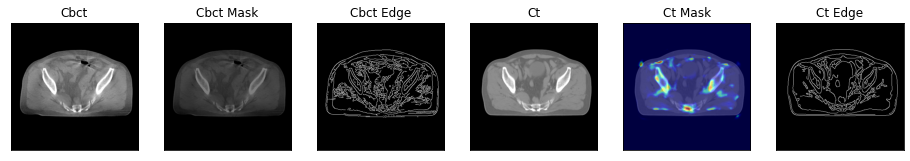

77it [00:23,  3.45it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.8128e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


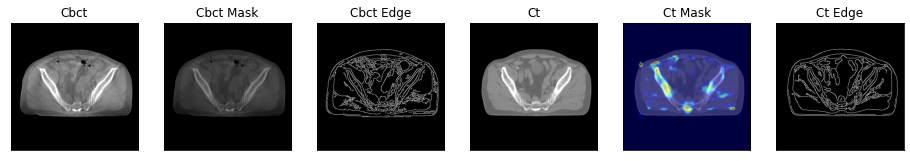

78it [00:23,  3.43it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.3680e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


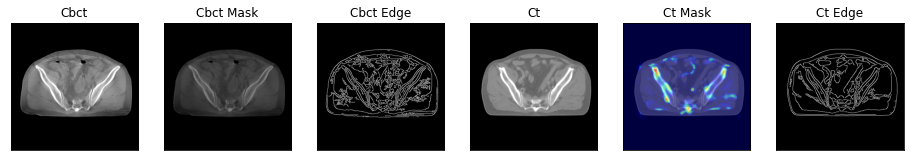

79it [00:24,  3.42it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


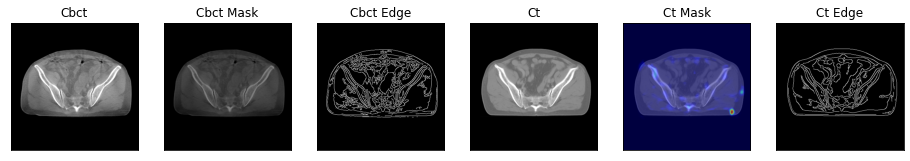

80it [00:24,  3.42it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.5540e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


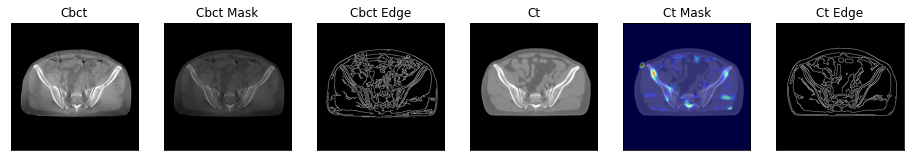

81it [00:24,  3.42it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.8874e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


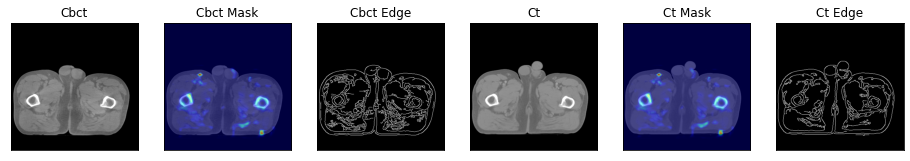

82it [00:24,  3.40it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3669e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


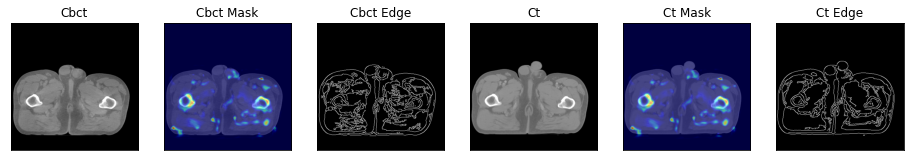

83it [00:25,  3.35it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.2989e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


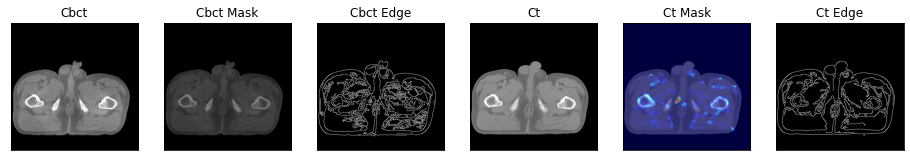

84it [00:25,  2.75it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


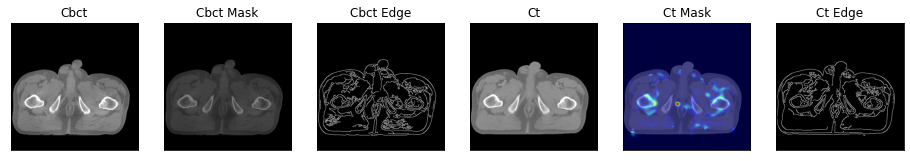

85it [00:26,  2.89it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.0786e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


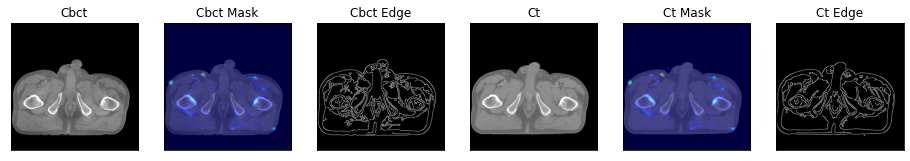

86it [00:26,  3.00it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.2111e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


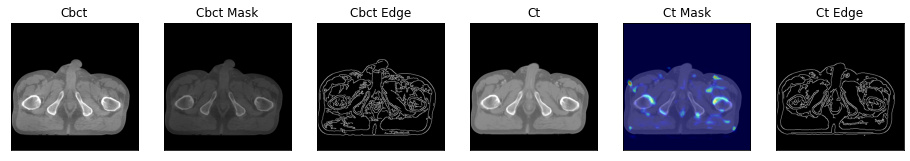

87it [00:26,  3.05it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.6477e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


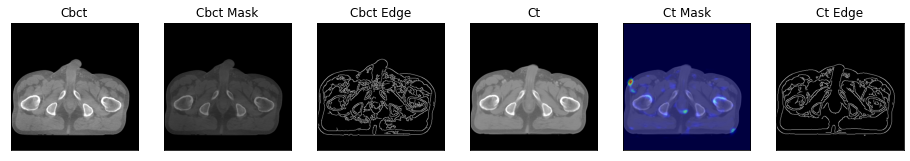

88it [00:27,  3.18it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


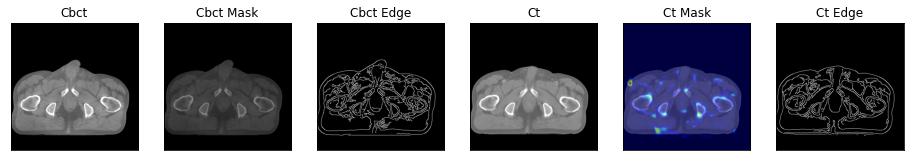

89it [00:27,  3.26it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0012]], device='cuda:0', grad_fn=<SigmoidBackward>)


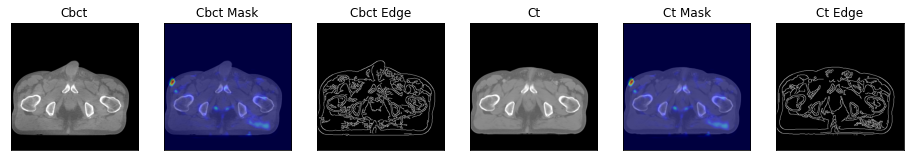

90it [00:27,  3.31it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)


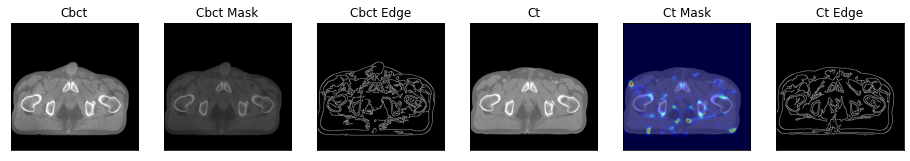

91it [00:27,  3.35it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


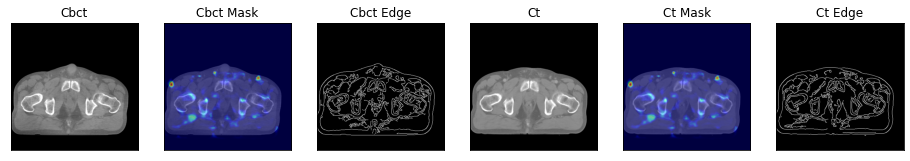

92it [00:28,  3.35it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)


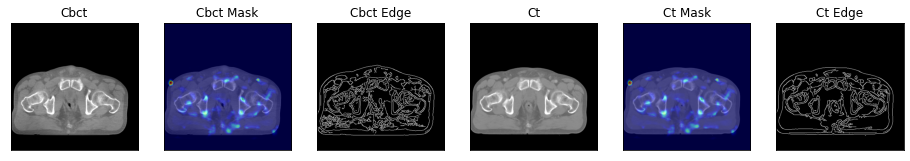

93it [00:28,  3.28it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.5371e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


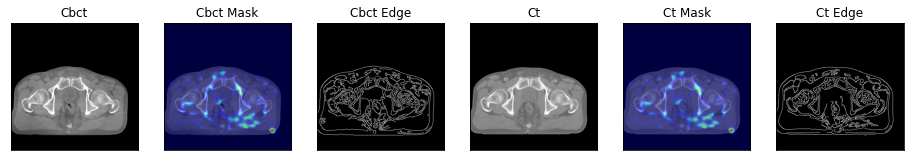

94it [00:28,  3.29it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.3701e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


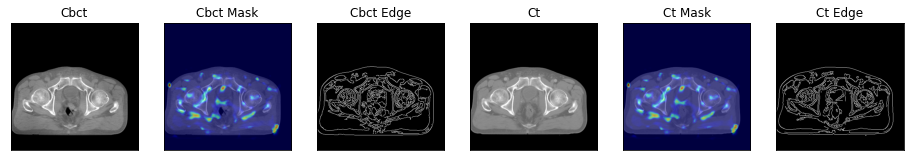

95it [00:29,  3.30it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.1347e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


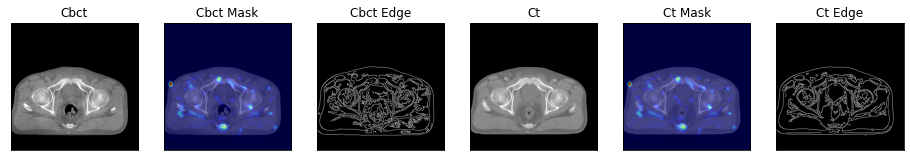

96it [00:29,  3.32it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.5584e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


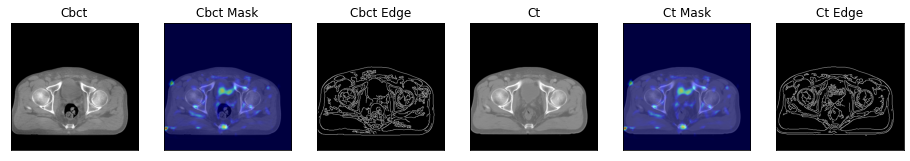

97it [00:29,  3.30it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0005]], device='cuda:0', grad_fn=<SigmoidBackward>)


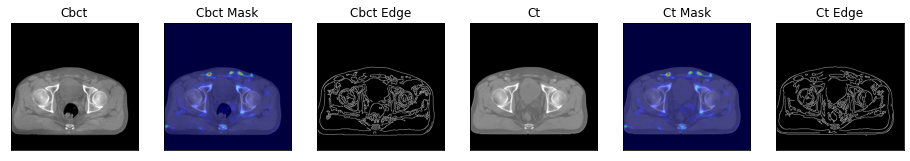

98it [00:29,  3.36it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


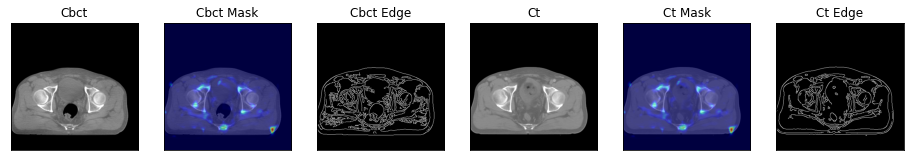

99it [00:30,  3.35it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0031]], device='cuda:0', grad_fn=<SigmoidBackward>)


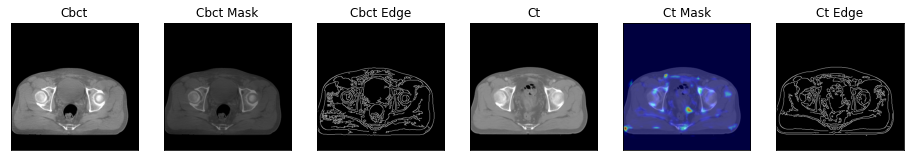

100it [00:30,  2.78it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.5612e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


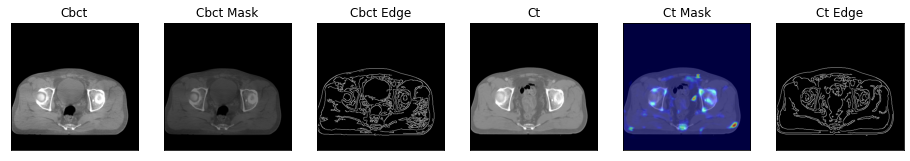

101it [00:31,  2.90it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0008]], device='cuda:0', grad_fn=<SigmoidBackward>)


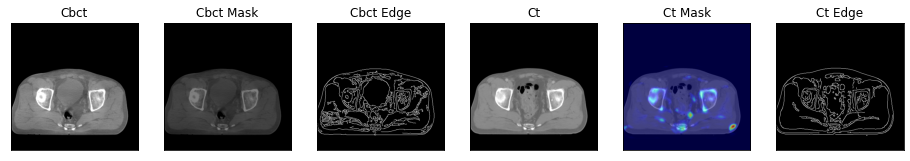

102it [00:31,  3.00it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0074]], device='cuda:0', grad_fn=<SigmoidBackward>)


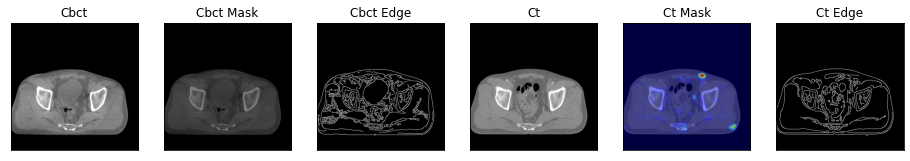

103it [00:31,  3.13it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0078]], device='cuda:0', grad_fn=<SigmoidBackward>)


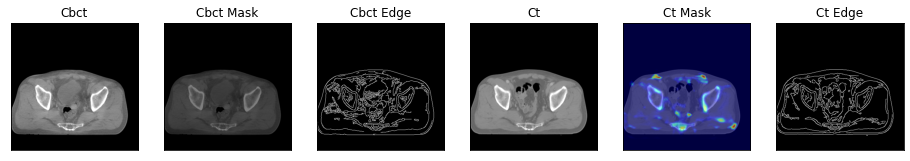

104it [00:32,  3.18it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0006]], device='cuda:0', grad_fn=<SigmoidBackward>)


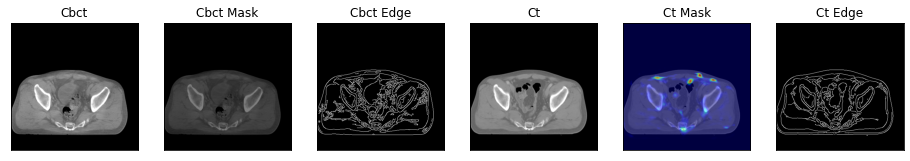

105it [00:32,  3.25it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0013]], device='cuda:0', grad_fn=<SigmoidBackward>)


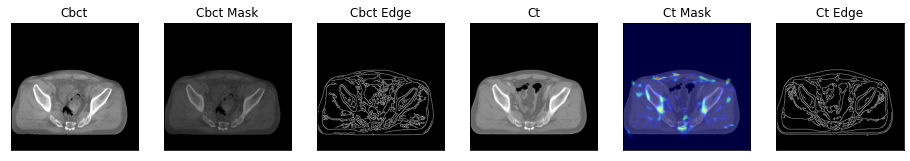

106it [00:32,  3.26it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)


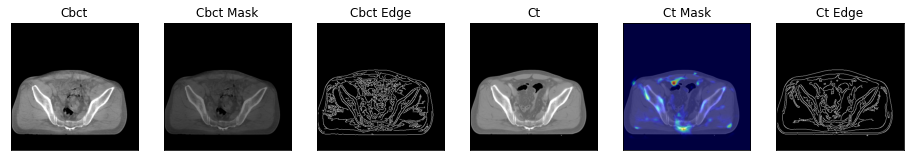

107it [00:32,  3.28it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0004]], device='cuda:0', grad_fn=<SigmoidBackward>)


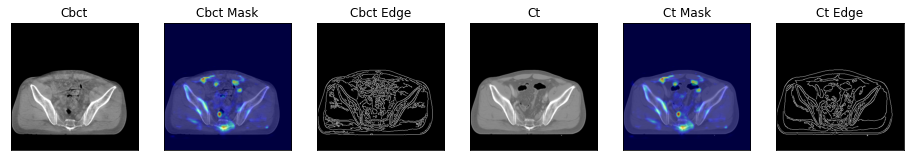

108it [00:33,  3.31it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3313e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


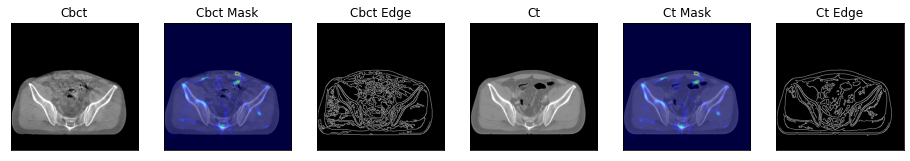

109it [00:33,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


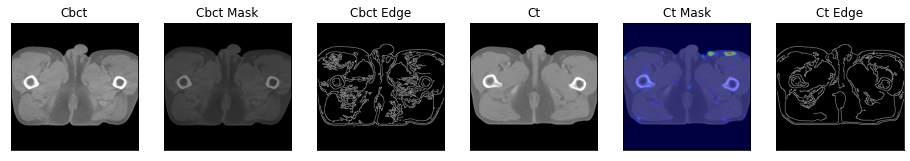

110it [00:33,  3.26it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


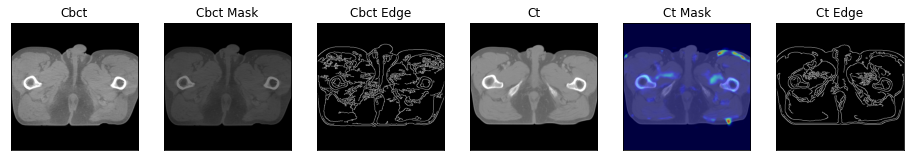

111it [00:34,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


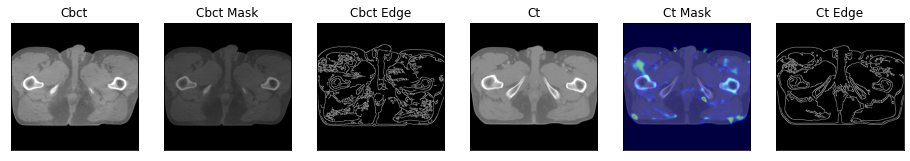

112it [00:34,  3.20it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.1029e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


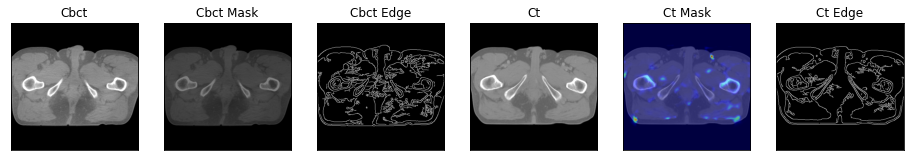

113it [00:34,  3.20it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.2805e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


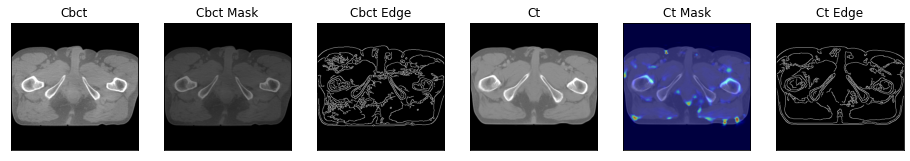

114it [00:35,  3.27it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.7267e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


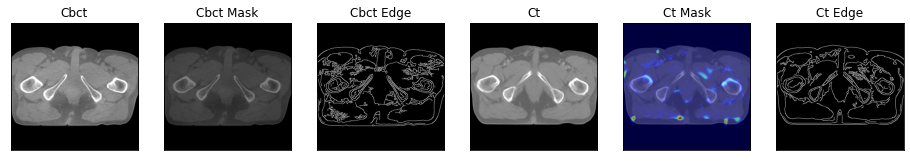

115it [00:35,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.1140e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


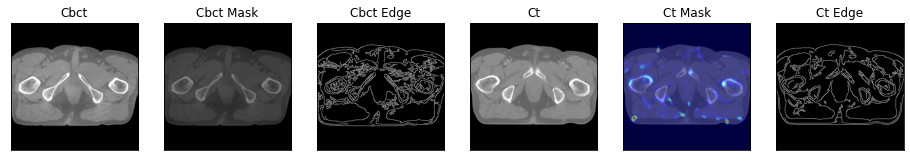

116it [00:35,  2.64it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.2778e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


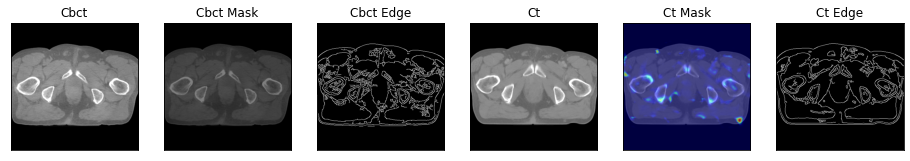

117it [00:36,  2.82it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


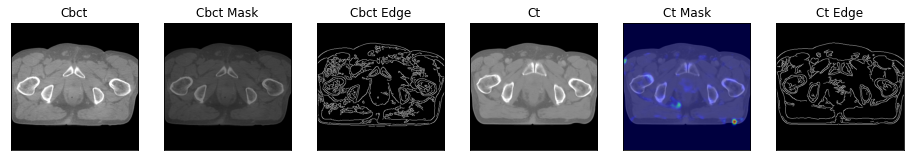

118it [00:36,  2.92it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.1323e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


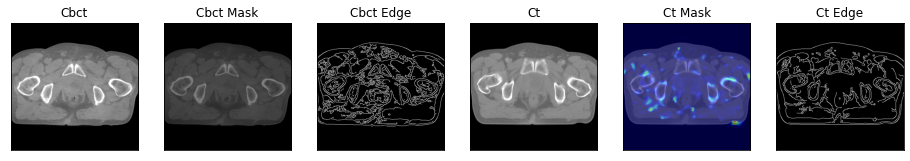

119it [00:36,  3.00it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.0377e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


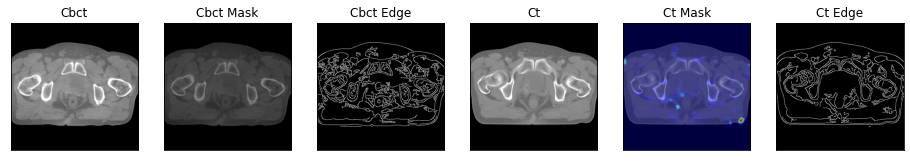

120it [00:37,  3.11it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.3979e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


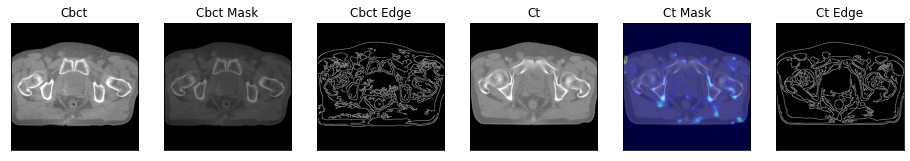

121it [00:37,  3.11it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.4938e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


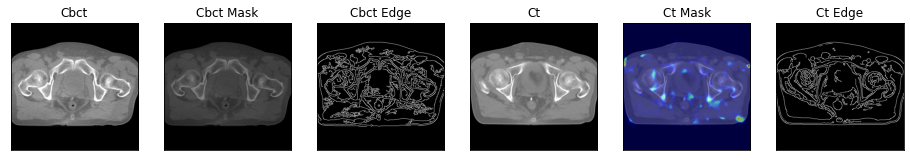

122it [00:37,  3.14it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.6429e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


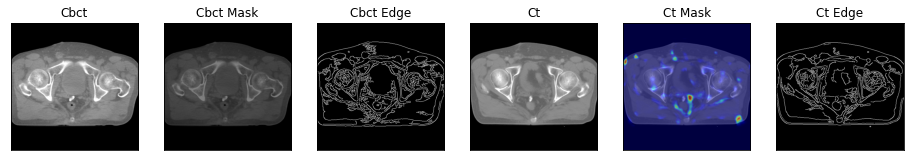

123it [00:38,  3.18it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.7361e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


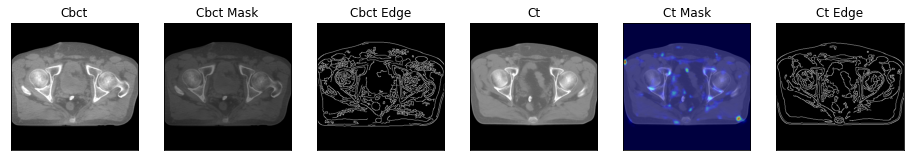

124it [00:38,  3.20it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.9267e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


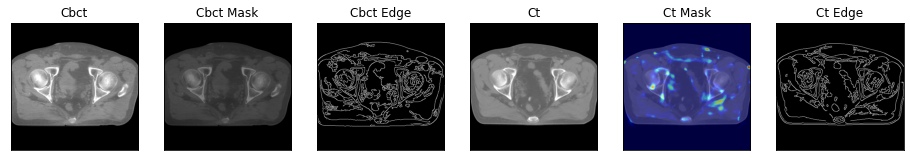

125it [00:38,  3.17it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.8908e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


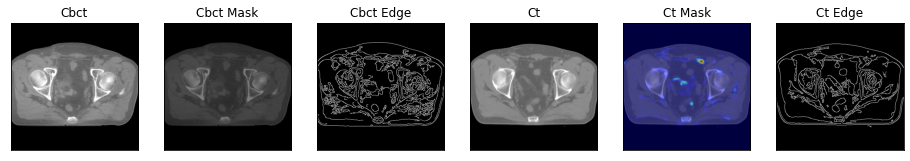

126it [00:39,  3.18it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.0573e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


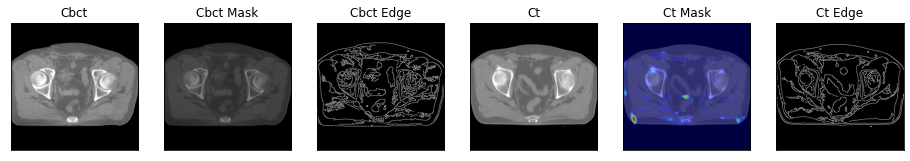

127it [00:39,  3.21it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.9817e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


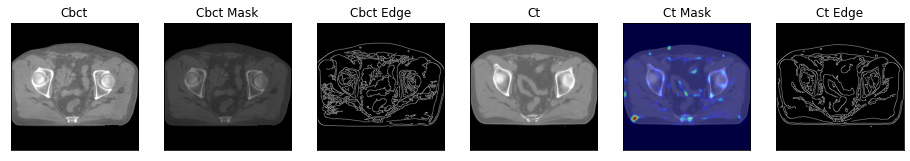

128it [00:39,  3.17it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.0379e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


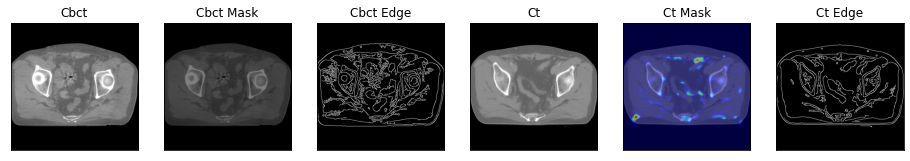

129it [00:39,  3.19it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.0419e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


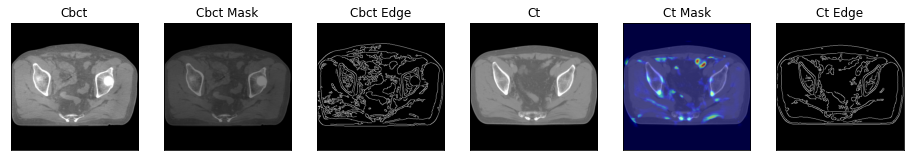

130it [00:40,  3.22it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.6266e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


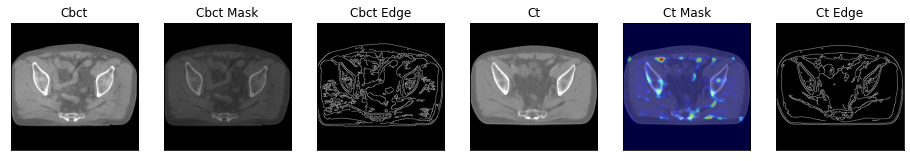

131it [00:40,  3.22it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.3418e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


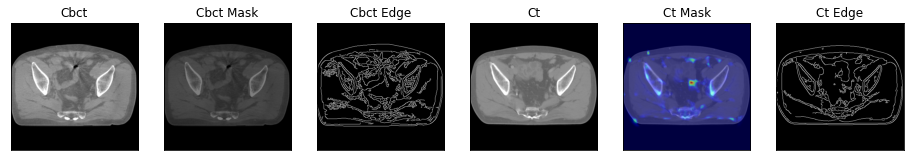

132it [00:41,  2.69it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


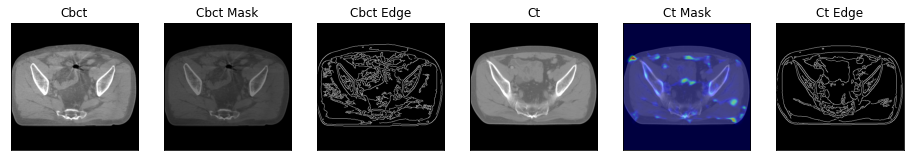

133it [00:41,  2.88it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.2768e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


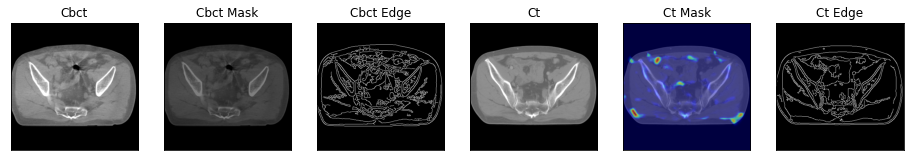

134it [00:41,  2.99it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.1930e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


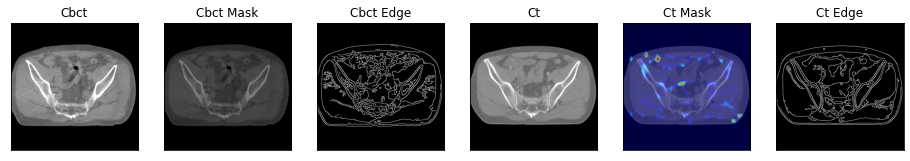

135it [00:41,  3.03it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.1462e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


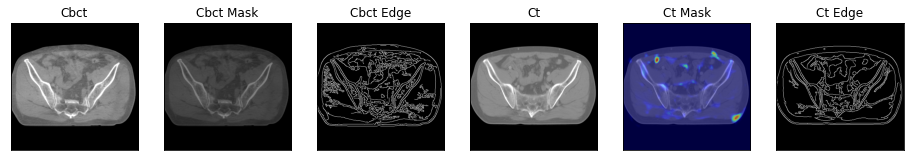

136it [00:42,  3.09it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0002]], device='cuda:0', grad_fn=<SigmoidBackward>)


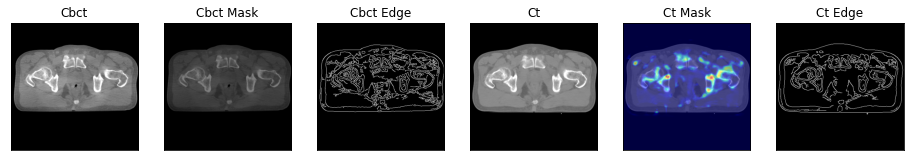

137it [00:42,  3.08it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0003]], device='cuda:0', grad_fn=<SigmoidBackward>)


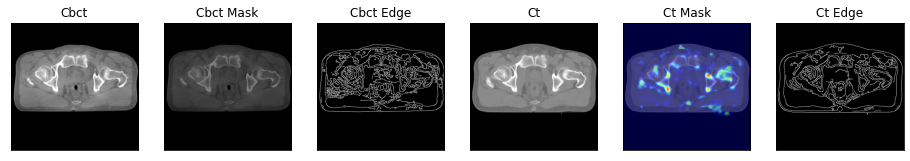

138it [00:42,  3.15it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.6860e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


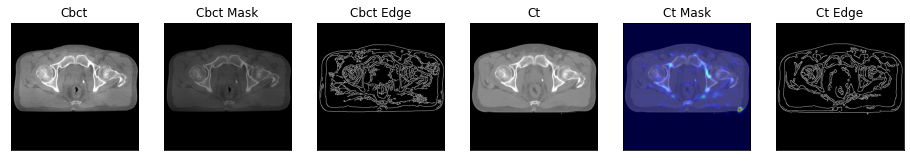

139it [00:43,  3.15it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.1245e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


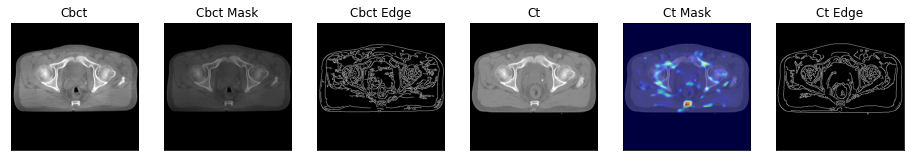

140it [00:43,  3.17it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.1127e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


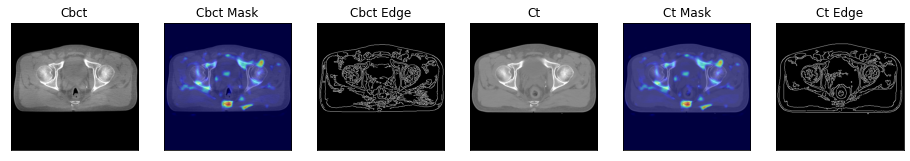

141it [00:43,  3.12it/s]

cbct prediction: tensor([[1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.7543e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


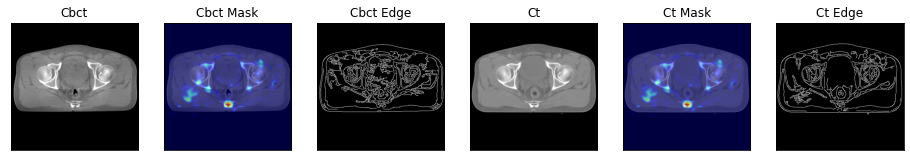

142it [00:44,  3.17it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3080e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


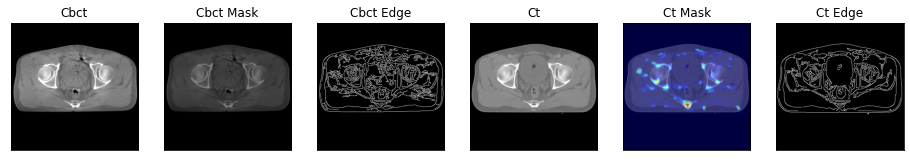

143it [00:44,  3.21it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.0350e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


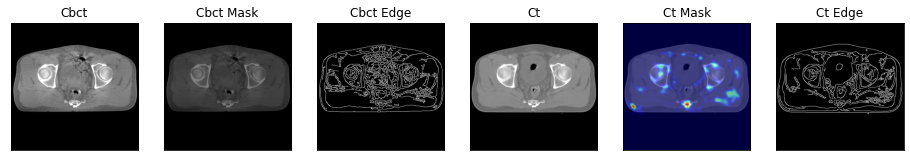

144it [00:44,  3.12it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.1881e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


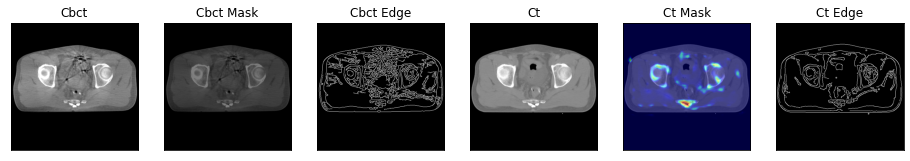

145it [00:45,  3.15it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.7948e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


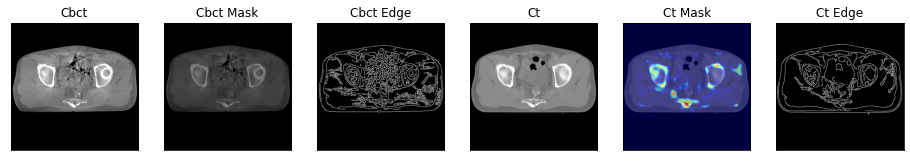

146it [00:45,  3.15it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.7605e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


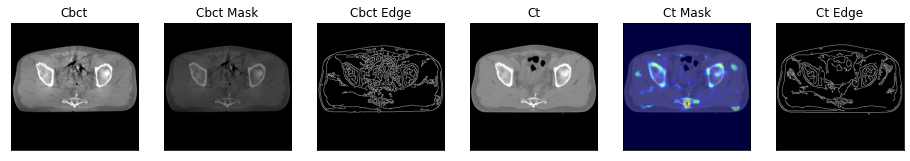

147it [00:45,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.8903e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


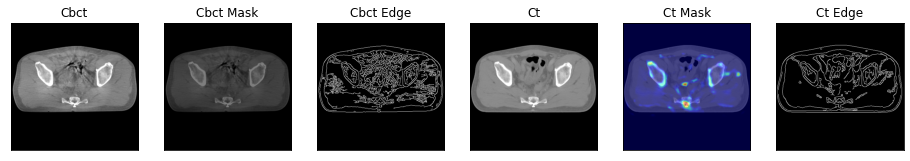

148it [00:46,  2.63it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.4737e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


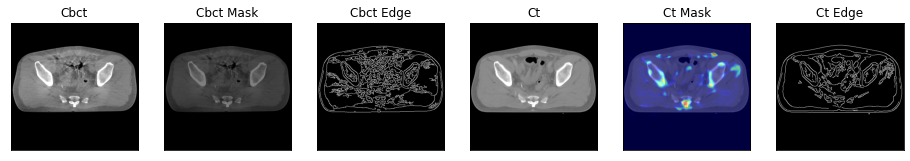

149it [00:46,  2.80it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.6529e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


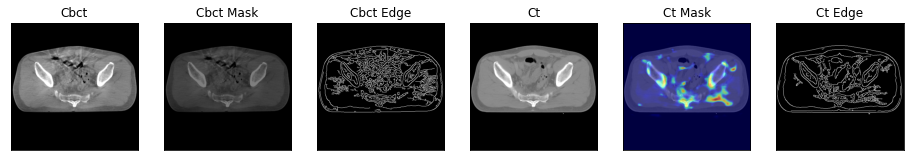

150it [00:46,  2.90it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[3.3005e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


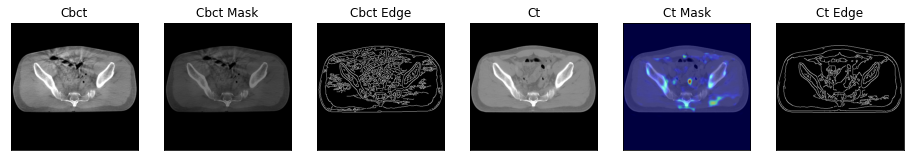

151it [00:47,  2.94it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.4820e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


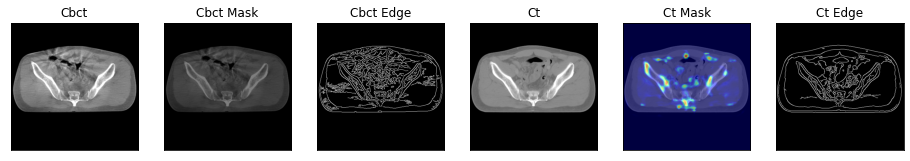

152it [00:47,  3.07it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.3831e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


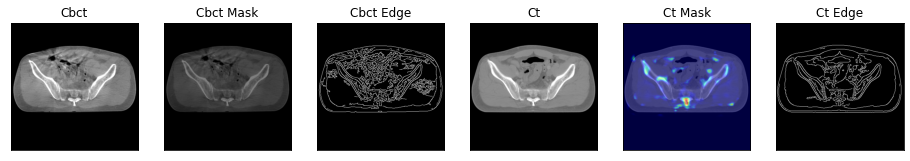

153it [00:47,  3.10it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.9104e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


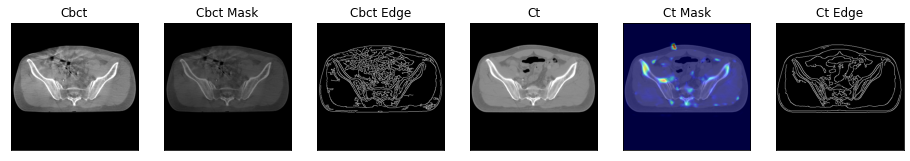

154it [00:48,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.1455e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


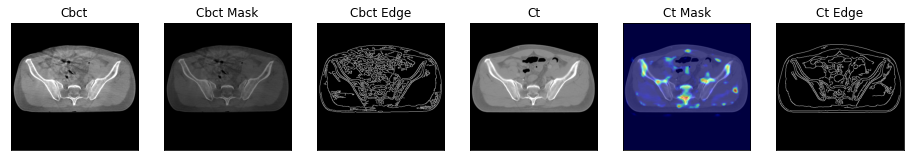

155it [00:48,  3.29it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.8240e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


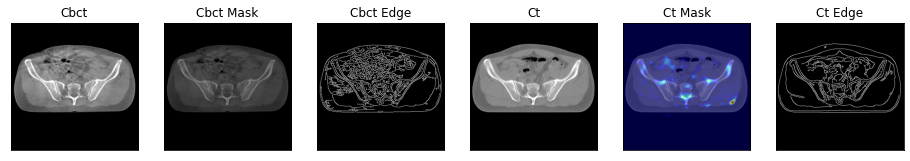

156it [00:48,  3.23it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.1043e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


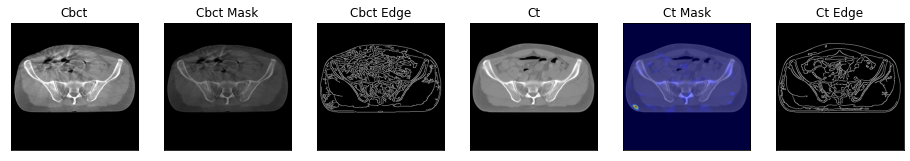

157it [00:49,  3.18it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.7189e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


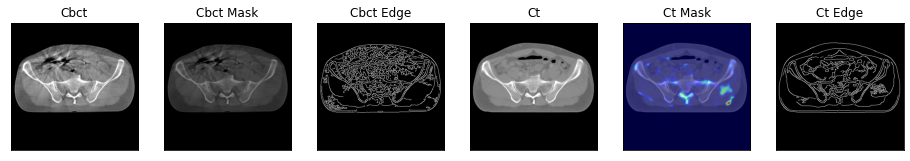

158it [00:49,  3.20it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.7727e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)


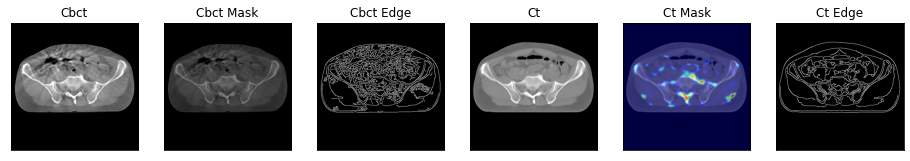

159it [00:49,  3.22it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.4350e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


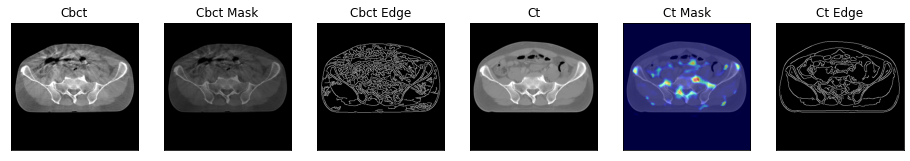

160it [00:49,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.0512e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


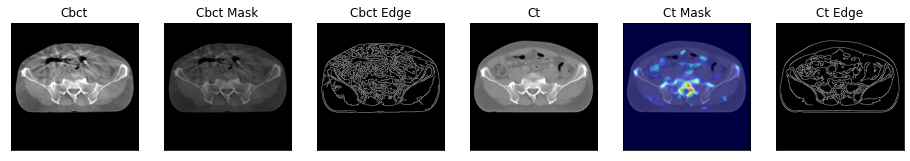

161it [00:50,  3.41it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[0.0001]], device='cuda:0', grad_fn=<SigmoidBackward>)


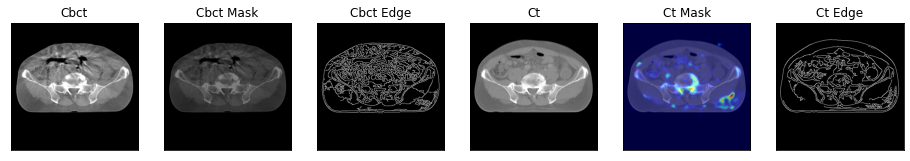

162it [00:50,  3.31it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3663e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


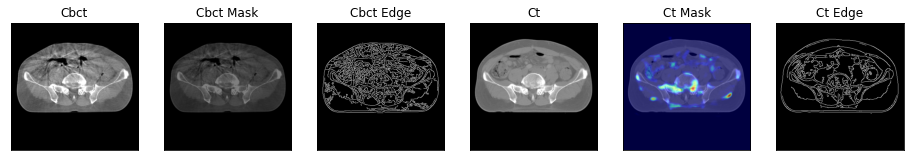

163it [00:50,  3.29it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[7.2805e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


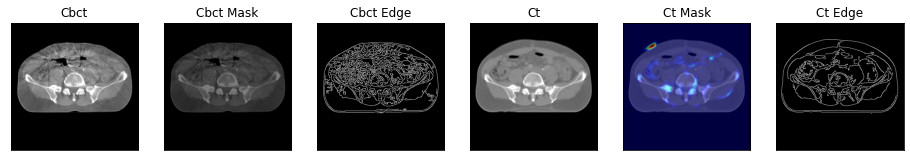

164it [00:51,  2.74it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.4901e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


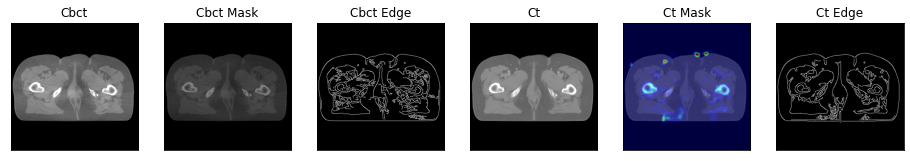

165it [00:51,  2.87it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[5.8711e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


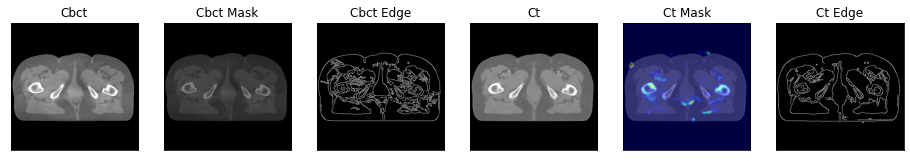

166it [00:52,  2.97it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.4798e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


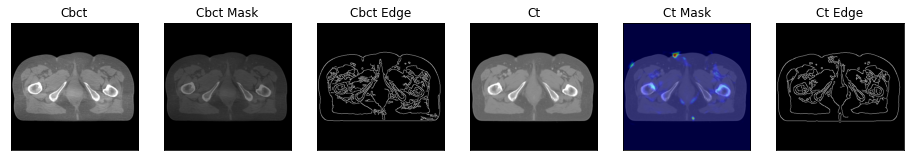

167it [00:52,  3.13it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.0742e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


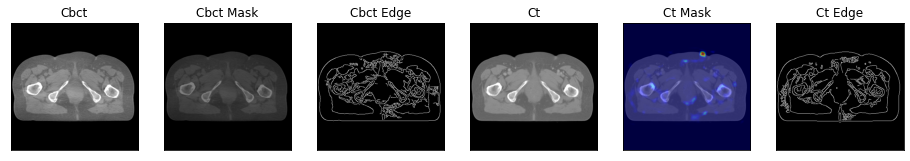

168it [00:52,  3.14it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.1608e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


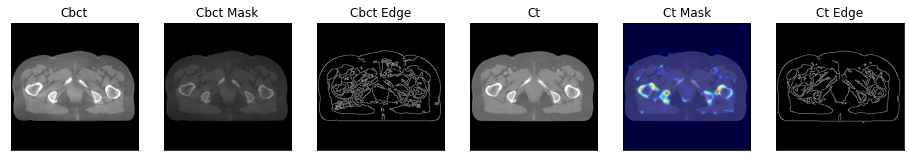

169it [00:52,  3.24it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.6136e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


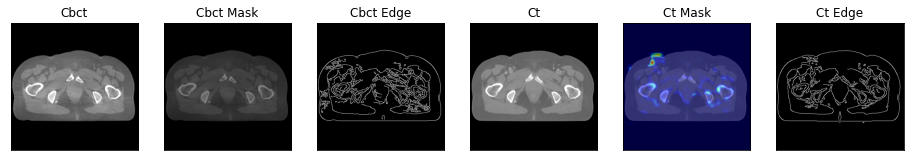

170it [00:53,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.9238e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


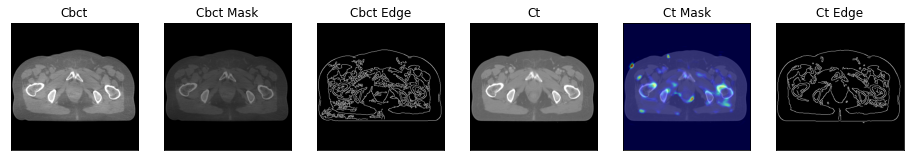

171it [00:53,  3.26it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.3110e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


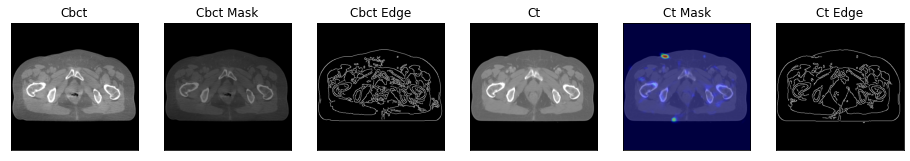

172it [00:53,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.1843e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


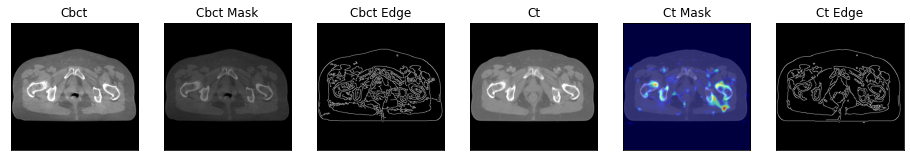

173it [00:54,  3.36it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.3660e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


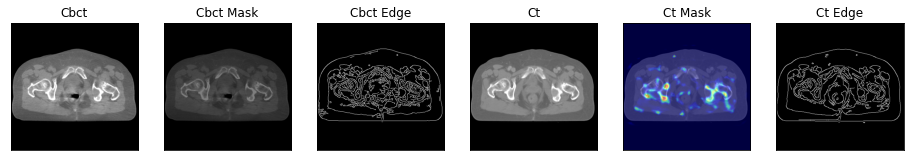

174it [00:54,  3.36it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.3597e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


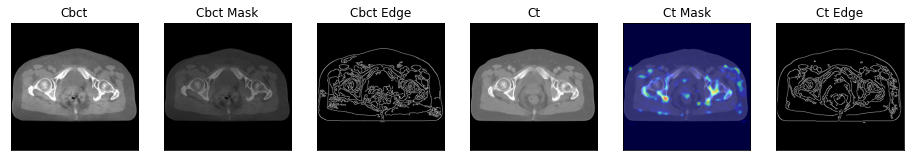

175it [00:54,  3.32it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.5521e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


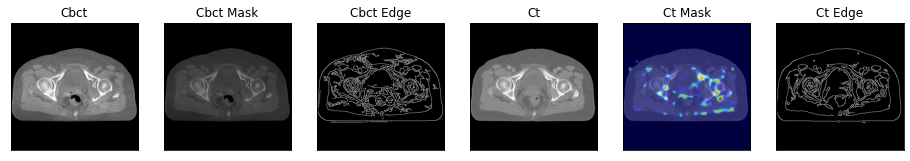

176it [00:54,  3.37it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.9648e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


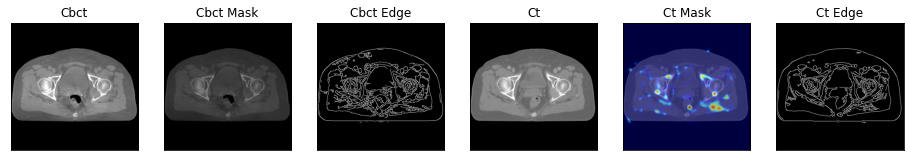

177it [00:55,  3.34it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[8.8625e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


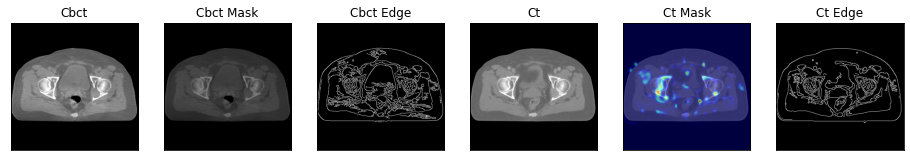

178it [00:55,  3.32it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[4.2878e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


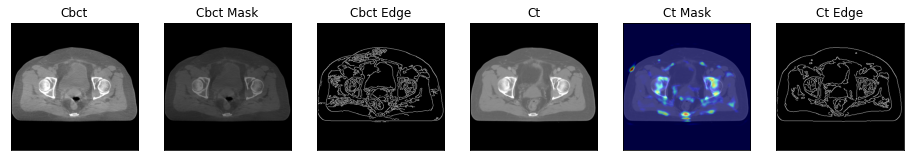

179it [00:55,  3.36it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.3556e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


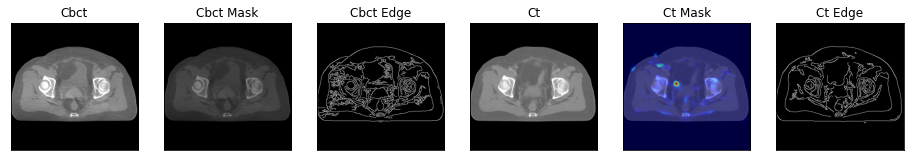

180it [00:56,  2.75it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.6885e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


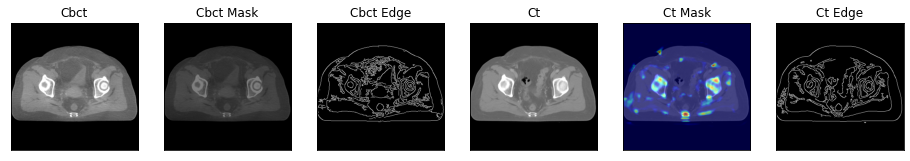

181it [00:56,  2.91it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.9080e-05]], device='cuda:0', grad_fn=<SigmoidBackward>)


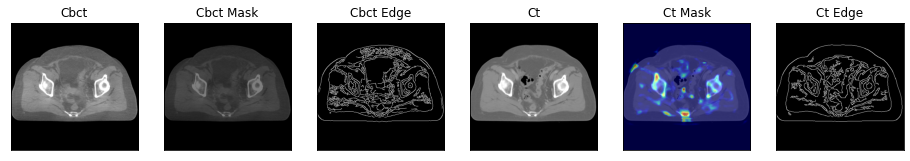

182it [00:56,  3.00it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.1848e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


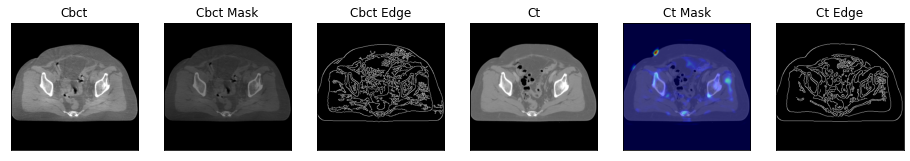

183it [00:57,  3.07it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.7426e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


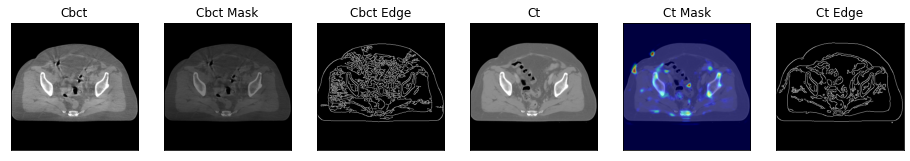

184it [00:57,  3.15it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.2251e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


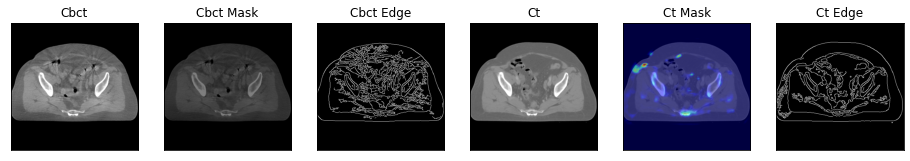

185it [00:57,  3.14it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[6.2451e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


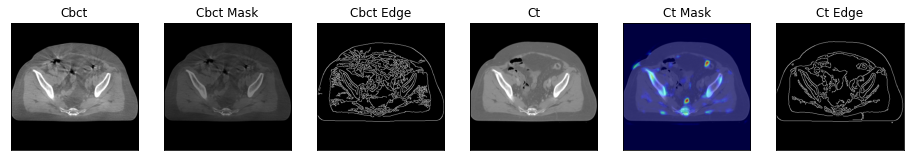

186it [00:58,  3.23it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.1193e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


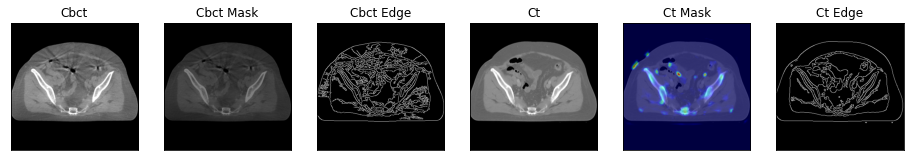

187it [00:58,  3.27it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[1.6077e-07]], device='cuda:0', grad_fn=<SigmoidBackward>)


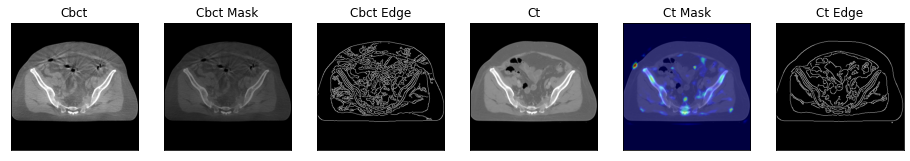

188it [00:58,  3.34it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.6157e-06]], device='cuda:0', grad_fn=<SigmoidBackward>)


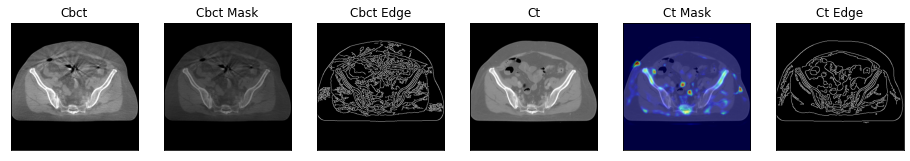

189it [00:59,  3.30it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[2.7029e-08]], device='cuda:0', grad_fn=<SigmoidBackward>)


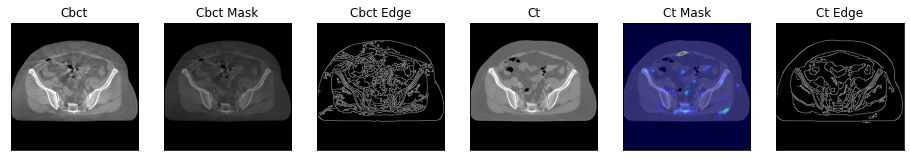

190it [00:59,  3.34it/s]

cbct prediction: tensor([[1.]], device='cuda:0', grad_fn=<SigmoidBackward>), ct prediction: tensor([[9.4192e-09]], device='cuda:0', grad_fn=<SigmoidBackward>)


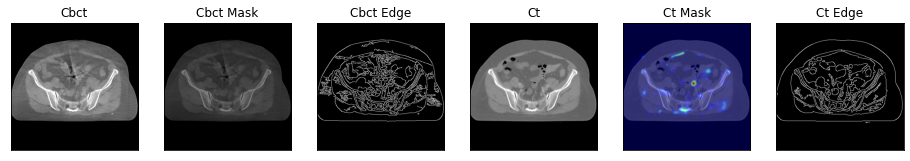

191it [00:59,  3.19it/s]


In [45]:
test_epoch(model, testloader, device)